# **Trabajo Fin de Master: Análisis de datos clínicos para el diagnóstico de lesiones orales**
# Sofia Retamales
# Junio 2025

# **0. Importacion de librerias  y configuraciones**

In [ ]:
!pip install fuzzywuzzy
!pip install ydata_profiling
!pip install python-Levenshtein
!pip install scikit-learn
!pip install catboost
!pip install lime
!pip install shap
!pip install interpret

In [ ]:
from google.colab import drive                # Biblioteca para utilizar el drive de google
import os #import path                        # Biblioteca para determinar la ruta de un archivo
import pandas as pd                           # Biblioteca para analisis y manipulacion de datos
import numpy as np                            # Biblioteca para operaciones matematicas y algebra
import matplotlib.pyplot as plt               # Biblioteca para graficos
import seaborn as sns                         # Biblioteca para graficos

from ydata_profiling import ProfileReport     # Biblioteca para perfilado de Datos
import unicodedata                            # Biblioteca para limpieza de datos
import re                                     # Biblioteca para limpieza de datos (exoresiones regulares)
import plotly.express as px                   # Biblioteca para hacer los graficos que les pueda hacer zoom

from fuzzywuzzy import fuzz                   # Biblioteca para encontrar similitudes entre palabras
from fuzzywuzzy import process                # Biblioteca para encontrar similitudes entre palabras

from sklearn.preprocessing import MinMaxScaler # Proceso de escalar las variables numericas, Size y Age
from sklearn.preprocessing import LabelEncoder # Encoder para variables categoricas

### Modelos y graficos de metricas
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV,  ShuffleSplit, KFold, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, roc_curve, auc, confusion_matrix, classification_report, ConfusionMatrixDisplay, precision_recall_curve, roc_auc_score, recall_score, log_loss, f1_score, make_scorer, average_precision_score
from sklearn.tree import DecisionTreeClassifier, plot_tree
import statsmodels.api as sm
from sklearn.feature_selection import RFE, SelectFromModel
from matplotlib_venn import venn3
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier, plot_importance
from catboost import CatBoostClassifier, Pool
from sklearn.model_selection import StratifiedKFold

# Lime y SHAP para interpretabilidad
from interpret import show
import lime
import lime.lime_tabular
from lime.lime_tabular import LimeTabularExplainer
import shap

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

### Adicionales
import warnings
warnings.filterwarnings('ignore')
plt.style.use('fivethirtyeight')
%matplotlib inline


# Definir la ruta/ directorio
drive.mount('/content/drive')
path="/content/drive/MyDrive/TFM/"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Datos Clinicos
datos_clinicos = pd.read_excel(path+"datos_clinicos.xlsx")
datos_clinicos.head()
datos_clinicos.shape #7429 filas y 25 columnas
datos_clinicos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7429 entries, 0 to 7428
Data columns (total 25 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Patient                   7429 non-null   object 
 1   Diagnosis                 7426 non-null   object 
 2   Clasification             7421 non-null   object 
 3   Localization              7422 non-null   object 
 4   Shape                     4711 non-null   object 
 5   Colour                    4710 non-null   object 
 6   Size (mm2)                4710 non-null   float64
 7   Unique                    4711 non-null   object 
 8   Multiple                  4711 non-null   object 
 9   Edges (hard -soft)        4711 non-null   object 
 10  Indurated edges (Yes/No)  4711 non-null   object 
 11  Exophytic                 4711 non-null   object 
 12  Ulcerated                 4711 non-null   object 
 13  Mixed                     4710 non-null   object 
 14  Consiste

In [ ]:
# Elimina los espacios en blanco de los extremos de los nombres de cada columna en el dataframe
# asi como las filas que no tengan una valores de clasificacion (Healthy, Bening, Potentially Malignant y Malignant)
datos_clinicos = datos_clinicos.dropna(subset=['Clasification'])

In [ ]:
perfil= ProfileReport(datos_clinicos)
perfil

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 25/25 [00:01<00:00, 21.71it/s]


KeyboardInterrupt: 

# **1. Depuracion de Datos**

In [ ]:
# Creacion del dataset depurado
datos_clinicos_filtrado = datos_clinicos.copy()

In [ ]:
# Limpieza de campos de texto con errores de tipeo
def limpiar_texto(text):
    if isinstance(text, str):
        text = text.lower()  # Convertir el texto a minúsculas
        text = text.strip()   # Eliminar espacios al principio y al final
        text = re.sub(r'[^\w\s;]', '', text)  # Eliminar puntuación, pero mantener ';'
        text = ''.join((c for c in unicodedata.normalize('NFD', text) if unicodedata.category(c) != 'Mn')) # Eliminar acentos
        return text
    return text

# Aplicar la función a las columnas de datos_clinicos
for col in datos_clinicos_filtrado.columns:
    if datos_clinicos_filtrado[col].dtype == 'object':
        datos_clinicos_filtrado[col] = datos_clinicos_filtrado[col].apply(limpiar_texto)

In [ ]:
# Eliminacion de registros duplicados, mas de un id_imagenes de un mismo paciente con las mismas caracteristicas, con lo cual se asume que son la misma lesion tomada mas de una vez para entrenar la red?
# Se eliminaran porque no aportarian informacion adicional. De los 7429 iniciales, quedan 3999 unicos
datos_clinicos_filtrado = datos_clinicos_filtrado.drop_duplicates()
datos_clinicos_filtrado.shape

(3999, 25)

In [ ]:
# Conversion de variables con valores de dos clases a booleanas de yes y no

# Shape
datos_clinicos_filtrado.rename(columns={'Shape': 'Shape_regular'}, inplace=True)
datos_clinicos_filtrado['Shape_regular'] = datos_clinicos_filtrado['Shape_regular'].replace('regular','yes')
datos_clinicos_filtrado['Shape_regular'] = datos_clinicos_filtrado['Shape_regular'].replace('irregular','no')

# Gender
datos_clinicos_filtrado.rename(columns={'Gender': 'Gender_male'}, inplace=True)
datos_clinicos_filtrado['Gender_male'] = datos_clinicos_filtrado['Gender_male'].replace('m','yes')
datos_clinicos_filtrado['Gender_male'] = datos_clinicos_filtrado['Gender_male'].replace('f','no')

# Edges (Hard-Soft)
datos_clinicos_filtrado.rename(columns={'Edges (hard -soft)': 'Edges_hard'}, inplace=True)
datos_clinicos_filtrado['Edges_hard'] = datos_clinicos_filtrado['Edges_hard'].replace('hard','yes')
datos_clinicos_filtrado['Edges_hard'] = datos_clinicos_filtrado['Edges_hard'].replace('soft','no')

# Consistency
datos_clinicos_filtrado.rename(columns={'Consistency': 'Consistency_hard'}, inplace=True)
datos_clinicos_filtrado['Consistency_hard'] = datos_clinicos_filtrado['Consistency_hard'].replace('hard','yes')
datos_clinicos_filtrado['Consistency_hard'] = datos_clinicos_filtrado['Consistency_hard'].replace('soft','no')

In [ ]:
# Conversion de tipo de dato a los que tengan errores de formato

# Number of Cigarettes los valores que no sean numeros reemplazarlos por nas
datos_clinicos_filtrado['Number of cigaretes/day'] = pd.to_numeric(datos_clinicos_filtrado['Number of cigaretes/day'], errors='coerce')

# Dose of Alcohol los valores que no sean numeros reemplazarlos por nas
datos_clinicos_filtrado['Dose of alcohol/day'] = pd.to_numeric(datos_clinicos_filtrado['Dose of alcohol/day'], errors='coerce')

In [ ]:
# Reasignacion de clases de variables que podria tener solo valores binarios de yes y no

# Tobaco
datos_clinicos_filtrado['Tobacco (Yes/No)'] = datos_clinicos_filtrado['Tobacco (Yes/No)'].replace('occasionally', 'yes')
datos_clinicos_filtrado['Tobacco (Yes/No)'] = datos_clinicos_filtrado['Tobacco (Yes/No)'].replace('yes', 'si_fuma')
datos_clinicos_filtrado['Tobacco (Yes/No)'] = datos_clinicos_filtrado['Tobacco (Yes/No)'].replace('no', 'no_fuma')

# Alcohol
datos_clinicos_filtrado['Alcohol (Yes/No)'] = datos_clinicos_filtrado['Alcohol (Yes/No)'].replace('occasionally', 'yes')

In [ ]:
# Reasignar las clases vacias de Drugs y Comorbidities por "Sin determinar" y valores de no por no_drugs y no_comorbidities

# Drugs
datos_clinicos_filtrado.loc[datos_clinicos_filtrado['Drugs'].isnull(), 'Drugs'] = 'sin_determinar_drugs'
datos_clinicos_filtrado['Drugs'] = datos_clinicos_filtrado['Drugs'].replace('no', 'no_drugs')

# Comorbidities
datos_clinicos_filtrado.loc[datos_clinicos_filtrado['Comorbidities'].isnull(), 'Comorbidities'] = 'sin_determinar_comorbidities'
datos_clinicos_filtrado['Comorbidities'] = datos_clinicos_filtrado['Comorbidities'].replace('no', 'no_comorbidities')

In [ ]:
# Función para validar variables mixtas (con más de un tipo de dato) y sus valores unicos
def validar_mixtas(df):
    """
    Revisa las columnas del DataFrame que contienen datos de tipo str (texto)
    y devuelve los valores únicos de cada variable de tipo texto en formato tabla,
    incluyendo una columna con la cantidad de valores únicos.
    """
    texto_unico = []

    # Recolectar los valores únicos de las columnas de tipo texto
    for col in df.columns:
        if df[col].dtype in ('object', 'str'):
            valores_unicos = df[col].dropna().unique()
            num_unicos = len(valores_unicos)  # Calcular la cantidad de valores únicos
            texto_unico.append([col, valores_unicos, num_unicos])  # Guardar columna, valores únicos y cantidad

    # Convertir el resultado a un DataFrame para una presentación más bonita
    resultado = pd.DataFrame(texto_unico, columns=['Variable', 'Valores Únicos', 'Cantidad de Únicos'])

    return resultado

validar_mixtas(datos_clinicos_filtrado)

,Variable,Valores Únicos,Cantidad de Únicos
0,Patient,"[p0001, p0002, p0003, p0004, p0005, p0006, p00...",2291
1,Diagnosis,"[leukoplakia, angioma, oral lichen planus, fib...",102
2,Clasification,"[potentially malignant, benign, healthy, malig...",4
3,Localization,"[floor of the mouth, soft palate, gingiva, buc...",36
4,Shape_regular,"[no, yes]",2
5,Colour,"[white, blue, no color change, red; white, red...",13
6,Unique,"[yes, no]",2
7,Multiple,"[no, yes]",2
8,Edges_hard,"[no, yes]",2
9,Indurated edges (Yes/No),"[no, yes]",2


# **2. Análisis Exploratorio**

In [ ]:
perfil= ProfileReport(datos_clinicos_filtrado)
perfil

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 25/25 [00:00<00:00, 35.28it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Almacenar en una lista las variables numericas y las variables categoricas
# Numericas
var_numericas = datos_clinicos_filtrado.select_dtypes(include=['number']).columns.tolist()
print(var_numericas)

# Categoricas
var_categoricas = datos_clinicos_filtrado.select_dtypes(exclude=['number']).columns.tolist()
print(var_categoricas)

['Size (mm2)', 'Age', 'Number of cigaretes/day', 'Dose of alcohol/day']
['Patient', 'Diagnosis', 'Clasification', 'Localization', 'Shape_regular', 'Colour', 'Unique', 'Multiple', 'Edges_hard', 'Indurated edges (Yes/No)', 'Exophytic', 'Ulcerated', 'Mixed', 'Consistency_hard', 'Pain', 'Cervical lymph nodes', 'Gender_male', 'Tobacco (Yes/No)', 'Alcohol (Yes/No)', 'Drugs', 'Comorbidities']


In [ ]:
# Grafico interactivo de la relacion de la variable 'Clasification' vs las variables numericas (es posible hacer zoom en los graficos)
for variable in var_numericas:
    fig = px.scatter(datos_clinicos_filtrado, x=variable, y='Clasification', color='Clasification')
    fig.show()

In [ ]:
# Grafico interactivo de relacion de la variable 'Clasification' vs las variables categoricas (es posible hacer zoom en los graficos)
for variable in var_categoricas:
    fig = px.histogram(datos_clinicos_filtrado, x=variable, color='Clasification', barmode='group')
    fig.update_layout(
        legend=dict(
            yanchor="top",
            y=0.99,
            xanchor="right",
            x=0.99
        )
    )
    fig.show()

# **3. Tansformación de Datos**

In [ ]:
# Creacion del dataset transformado para utilizar datos de imagenes y de pacientes
datos_clinicos_transf = datos_clinicos_filtrado.copy()

In [ ]:
# Conversión de las variables booleanas de 'yes' y 'no' a 1 y 0
for col in datos_clinicos_transf.columns:
    if datos_clinicos_transf[col].dtype == 'object':
        unique_values = datos_clinicos_transf[col].dropna().unique()
        if all(x in ['yes', 'no'] for x in unique_values):
          #datos_clinicos_transf[col] = datos_clinicos_transf[col].replace({'yes': 1, 'no': 0}).astype(int)
          datos_clinicos_transf[col] = datos_clinicos_transf[col].replace({'yes': 1, 'no': 0}).astype(float)

          #datos_clinicos_transf[col] = datos_clinicos_transf[col].replace({'yes': 1, 'no': 0})

datos_clinicos_transf

,Patient,Diagnosis,Clasification,Localization,Shape_regular,Colour,Size (mm2),Unique,Multiple,Edges_hard,...,Pain,Cervical lymph nodes,Age,Gender_male,Tobacco (Yes/No),Number of cigaretes/day,Alcohol (Yes/No),Dose of alcohol/day,Drugs,Comorbidities
0,p0001,leukoplakia,potentially malignant,floor of the mouth,0.0,white,300.0,1.0,0.0,0.0,...,0.0,0.0,58.0,1.0,si_fuma,20.0,0.0,NaN,no_drugs,no_comorbidities
1,p0001,leukoplakia,potentially malignant,floor of the mouth,0.0,white,200.0,1.0,0.0,0.0,...,0.0,0.0,58.0,1.0,si_fuma,20.0,0.0,NaN,no_drugs,no_comorbidities
2,p0002,angioma,benign,soft palate,1.0,blue,300.0,1.0,0.0,0.0,...,0.0,0.0,76.0,0.0,no_fuma,NaN,0.0,NaN,metformin,hypertension; type ii diabetes; hemochromatosis
3,p0003,oral lichen planus,potentially malignant,gingiva,0.0,white,150.0,1.0,0.0,0.0,...,1.0,0.0,60.0,0.0,no_fuma,NaN,0.0,NaN,no_drugs,no_comorbidities
5,p0004,oral lichen planus,potentially malignant,buccal mucosa,0.0,white,500.0,1.0,0.0,0.0,...,0.0,0.0,77.0,0.0,exsmoker,NaN,0.0,NaN,losartran; sinvastatin; omeprazol; rupatadine;...,sin_determinar_comorbidities
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7424,p2296,oral submucous fibrosis,potentially malignant,gingiva; buccal mucosa,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,sin_determinar_drugs,sin_determinar_comorbidities
7425,p2297,oral submucous fibrosis,potentially malignant,gingiva; buccal mucosa,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,sin_determinar_drugs,sin_determinar_comorbidities
7426,p2298,erythroplasia,potentially malignant,gingiva; buccal mucosa,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,sin_determinar_drugs,sin_determinar_comorbidities
7427,p2299,erythroplasia,potentially malignant,gingiva; buccal mucosa,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,sin_determinar_drugs,sin_determinar_comorbidities


## **3.1. Desarrollo de una función para determinar los valores similares dentro de las clases de una variable categorica**

La variables a transformarse son:

- Localization
- Colour
- Drugs
- Comorbidities

In [ ]:
def limpiar_palabras(texto):
    """
    Limpia el texto eliminando caracteres no deseados, convirtiendo a minúsculas,
    reemplazando "and", ":", "y", "," por ";" y eliminando tildes.
    """
    # Convertir todo a minúsculas para comparar sin distinción de mayúsculas
    texto = texto.lower()

    # Reemplazar "and", ":", "y", "," por ";"
    texto = texto.replace(" and", ";")
    texto = texto.replace("and ", ";")
    texto = texto.replace(" and ", ";")
    texto = texto.replace(":", ";")
    texto = texto.replace(" y", ";")
    texto = texto.replace("y ", ";")
    texto = texto.replace(" y ", ";")
    texto = texto.replace(",", ";")

    # Eliminar caracteres no alfanuméricos (excepto los espacios y números)
    texto = re.sub(r"[^\w\s;,y]", "", texto)

    # Normalizar el texto para eliminar tildes
    texto = unicodedata.normalize('NFKD', texto).encode('ascii', 'ignore').decode('ascii')

    # Limpiar espacios adicionales y separar por ";"
    palabras = texto.split(";")

    # Eliminar espacios al principio y al final de las palabras
    palabras = [palabra.strip() for palabra in palabras if palabra.strip()]

    return palabras


def identificar_similares(palabras, umbral=65):
    """
    Identifica palabras similares dentro de una lista de palabras, utilizando la distancia de Levenshtein a partir de un umbral del 65%.
    Filtra aquellas que son idénticas y solo agrupa las que son variantes o errores tipográficos.
    Devuelve un dataframe donde cada fila es un subconjunto de palabras similares
    """
    grupos_similares = []
    palabras_vistas = []

    while palabras:
        palabra = palabras.pop(0)
        grupo = [palabra]

        for otra_palabra in palabras[:]:
            if fuzz.ratio(palabra, otra_palabra) > umbral and palabra != otra_palabra:  # Comparar similitud pero no idénticas
                grupo.append(otra_palabra)
                palabras.remove(otra_palabra)

        # Asegurarnos de que el grupo no contenga solo la palabra repetida
        if len(grupo) > 1:
            grupos_similares.append(grupo)

    return grupos_similares


def procesar_similares(df, columna):
    """
    Procesa la columna de un DataFrame, limpiando palabras,
    eliminando caracteres raros y agrupando palabras similares. Una las funciones anteriores.
    """
    # Obtener la lista de valores de la columna
    valores = df[columna].dropna().unique()

    # Extraer y limpiar todas las palabras de los valores (funcion creada)
    palabras = []
    for valor in valores:
        valores_divididos = limpiar_palabras(valor)
        palabras.extend(valores_divididos)

    palabras_unicas = list(set(palabras))

    # Identificar palabras similares (funcion creada)
    grupos_similares = identificar_similares(palabras_unicas)


    datos_grupos = []
    for grupo in grupos_similares:
        if grupo:
            fila = [grupo[0]] + grupo[1:]
            datos_grupos.append(fila)

    if not datos_grupos:
        columnas = ['Palabra Representativa']
        df_grupos_similares = pd.DataFrame(columns=columnas)
    else:
        max_cols = max(len(grupo) for grupo in datos_grupos)
        columnas = ['Palabra Representativa'] + [f'Similar {i+1}' for i in range(max_cols - 1)]
        datos_grupos_rellenados = [fila + [None] * (max_cols - len(fila)) for fila in datos_grupos]
        df_grupos_similares = pd.DataFrame(datos_grupos_rellenados, columns=columnas)

    return df_grupos_similares

In [ ]:
# Procesamiento de la columna de localization (Localization)
similares_localization = procesar_similares(datos_clinicos_transf, 'Localization')
similares_localization['Correcto']= np.nan
similares_localization.to_excel(path+'localizaciones_similares.xlsx', index=False)

# Procesamiento de la columna de colores (Colour)
similares_color = procesar_similares(datos_clinicos_transf, 'Colour')
similares_color['Correcto']= np.nan
similares_color.to_excel(path+'colour_similares.xlsx', index=False)

# Procesamiento de la columna de medicamentos (Drugs)
similares_medicamentos = procesar_similares(datos_clinicos_transf, 'Drugs')
similares_medicamentos['Correcto']= np.nan
similares_medicamentos.to_excel(path+'medicamentos_similares.xlsx', index=False)

# Procesamiento de la columna de comorbilidades (Comorbidities)
similares_comorbilidades = procesar_similares(datos_clinicos_transf, 'Comorbidities')
similares_comorbilidades['Correcto']= np.nan
similares_comorbilidades.to_excel(path+'comorbilidades_similares.xlsx', index=False)


In [ ]:
def reemplazar_similares(df_original, df_similares, columna_target):
    """
    Reemplaza palabras similares por una versión correcta y ordena
    alfabéticamente los términos en cada celda del DataFrame.
    """
    import pandas as pd

    for idx, row in df_similares.iterrows():
        palabra_correcta = str(row['Correcto']).strip().lower()

        palabras_a_reemplazar = [str(row[col]).strip().lower() for col in df_similares.columns
                                 if col != 'Correcto' and pd.notna(row[col])]

        palabra_representativa = str(row['Palabra Representativa']).strip().lower()
        if palabra_representativa not in palabras_a_reemplazar:
            palabras_a_reemplazar.append(palabra_representativa)

        for idx_original, valor in df_original[columna_target].items():
            if pd.notna(valor):
                palabras = [p.strip() for p in valor.split(";") if p.strip()]
                palabras_corregidas = [palabra_correcta if palabra.lower() in palabras_a_reemplazar else palabra for palabra in palabras]
                df_original.at[idx_original, columna_target] = ";".join(palabras_corregidas)

    # PASO FINAL: Limpiar, eliminar duplicados y ordenar alfabéticamente cada celda
    for idx, valor in df_original[columna_target].items():
        if pd.notna(valor):
            palabras = [p.strip() for p in valor.split(";") if p.strip()]
            palabras_unicas = sorted(set(palabras), key=lambda x: x.lower())
            df_original.at[idx, columna_target] = "; ".join(palabras_unicas)

    return df_original


In [ ]:
# Carga del archivo de datos de palabras similares (representativas y correctas)
localizaciones_similares_corregido = pd.read_excel(path+ 'localizaciones_similares_corregido.xlsx')
colour_similares_corregido = pd.read_excel(path+"colour_similares_corregido.xlsx")
medicamentos_similares_corregidos = pd.read_excel(path+"medicamentos_similares_corregido.xlsx")
comorbilidades_similares_corregidos = pd.read_excel(path+'comorbilidades_similares_corregido.xlsx')

# Reemplazo de palabras en la columna 'Drugs' y 'Comorbidities'
reemplazar_similares(datos_clinicos_transf, localizaciones_similares_corregido, 'Localization')
reemplazar_similares(datos_clinicos_transf, colour_similares_corregido, 'Colour')
reemplazar_similares(datos_clinicos_transf, medicamentos_similares_corregidos, 'Drugs')
reemplazar_similares(datos_clinicos_transf, comorbilidades_similares_corregidos, 'Comorbidities')

,Patient,Diagnosis,Clasification,Localization,Shape_regular,Colour,Size (mm2),Unique,Multiple,Edges_hard,...,Pain,Cervical lymph nodes,Age,Gender_male,Tobacco (Yes/No),Number of cigaretes/day,Alcohol (Yes/No),Dose of alcohol/day,Drugs,Comorbidities
0,p0001,leukoplakia,potentially malignant,floor of the mouth,0.0,white,300.0,1.0,0.0,0.0,...,0.0,0.0,58.0,1.0,si_fuma,20.0,0.0,NaN,no_drugs,no_comorbidities
1,p0001,leukoplakia,potentially malignant,floor of the mouth,0.0,white,200.0,1.0,0.0,0.0,...,0.0,0.0,58.0,1.0,si_fuma,20.0,0.0,NaN,no_drugs,no_comorbidities
2,p0002,angioma,benign,palate,1.0,blue,300.0,1.0,0.0,0.0,...,0.0,0.0,76.0,0.0,no_fuma,NaN,0.0,NaN,metformina,diabetes type 2; hemochromatosis; hipertension
3,p0003,oral lichen planus,potentially malignant,gingiva,0.0,white,150.0,1.0,0.0,0.0,...,1.0,0.0,60.0,0.0,no_fuma,NaN,0.0,NaN,no_drugs,no_comorbidities
5,p0004,oral lichen planus,potentially malignant,buccal mucosa,0.0,white,500.0,1.0,0.0,0.0,...,0.0,0.0,77.0,0.0,exsmoker,NaN,0.0,NaN,adiro; losartan; omeprazol; rupatadine; simvas...,sin_determinar_comorbidities
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7424,p2296,oral submucous fibrosis,potentially malignant,buccal mucosa; gingiva,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,sin_determinar_drugs,sin_determinar_comorbidities
7425,p2297,oral submucous fibrosis,potentially malignant,buccal mucosa; gingiva,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,sin_determinar_drugs,sin_determinar_comorbidities
7426,p2298,erythroplasia,potentially malignant,buccal mucosa; gingiva,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,sin_determinar_drugs,sin_determinar_comorbidities
7427,p2299,erythroplasia,potentially malignant,buccal mucosa; gingiva,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,sin_determinar_drugs,sin_determinar_comorbidities


In [ ]:
# Creacion de un dataset sin convertir las variables categoricas, para utilizarlas en catboost que realiza target encoding a las variables originales
datos_clinicos_catboost = datos_clinicos_transf.copy()

## **3.2 Exploracion post transformación**

In [ ]:
perfil= ProfileReport(datos_clinicos_transf)
perfil

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 25/25 [00:01<00:00, 23.26it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Nuevamente existen duplicados posiblemente por la reescritura de localizaciones,
# colores, comorbidades o medicamentos similares, son aprox 200. Decido no eliminarlos
a=datos_clinicos_transf
a.drop_duplicates()

,Patient,Diagnosis,Clasification,Localization,Shape_regular,Colour,Size (mm2),Unique,Multiple,Edges_hard,...,Pain,Cervical lymph nodes,Age,Gender_male,Tobacco (Yes/No),Number of cigaretes/day,Alcohol (Yes/No),Dose of alcohol/day,Drugs,Comorbidities
0,p0001,leukoplakia,potentially malignant,floor of the mouth,0.0,white,300.0,1.0,0.0,0.0,...,0.0,0.0,58.0,1.0,si_fuma,20.0,0.0,NaN,no_drugs,no_comorbidities
1,p0001,leukoplakia,potentially malignant,floor of the mouth,0.0,white,200.0,1.0,0.0,0.0,...,0.0,0.0,58.0,1.0,si_fuma,20.0,0.0,NaN,no_drugs,no_comorbidities
2,p0002,angioma,benign,palate,1.0,blue,300.0,1.0,0.0,0.0,...,0.0,0.0,76.0,0.0,no_fuma,NaN,0.0,NaN,metformina,diabetes type 2; hemochromatosis; hipertension
3,p0003,oral lichen planus,potentially malignant,gingiva,0.0,white,150.0,1.0,0.0,0.0,...,1.0,0.0,60.0,0.0,no_fuma,NaN,0.0,NaN,no_drugs,no_comorbidities
5,p0004,oral lichen planus,potentially malignant,buccal mucosa,0.0,white,500.0,1.0,0.0,0.0,...,0.0,0.0,77.0,0.0,exsmoker,NaN,0.0,NaN,adiro; losartan; omeprazol; rupatadine; simvas...,sin_determinar_comorbidities
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7424,p2296,oral submucous fibrosis,potentially malignant,buccal mucosa; gingiva,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,sin_determinar_drugs,sin_determinar_comorbidities
7425,p2297,oral submucous fibrosis,potentially malignant,buccal mucosa; gingiva,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,sin_determinar_drugs,sin_determinar_comorbidities
7426,p2298,erythroplasia,potentially malignant,buccal mucosa; gingiva,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,sin_determinar_drugs,sin_determinar_comorbidities
7427,p2299,erythroplasia,potentially malignant,buccal mucosa; gingiva,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,sin_determinar_drugs,sin_determinar_comorbidities


In [ ]:
# Aun existen variables con gran numero de niveles a las que es necesario aplicar tecnicas de feature engineering
def cant_niveles(df):
    categorical_cols = df.select_dtypes(include=['object', 'category']).columns
    unique_counts = {}
    for col in categorical_cols:
        unique_counts[col] = df[col].nunique()
    return unique_counts

cant_niveles(datos_clinicos_transf)

{'Patient': 2291,
 'Diagnosis': 102,
 'Clasification': 4,
 'Localization': 22,
 'Colour': 12,
 'Tobacco (Yes/No)': 3,
 'Drugs': 277,
 'Comorbidities': 160}


## **3.3. Feature Engineering**

Conversión de variables categóricas a dummies con distintass técnicas:
- Hot Encoding (para las de pocos niveles: Colour, Localization y Tobaco, en sus categorias originales)
- Importancia de variables a partir de arboles de decision (para variables con muchos niveles: Comorbidities y Drugs)
- Umbral de minimo numero de observaciones por medicamento y comorbidad
- Se debe analizar por independiente cada medicamento, color, localizacion, y comorbidad (Es decir una columna por valor)

In [ ]:
# Histograma de Drugs y Comorbidities
print(datos_clinicos_transf['Drugs'].value_counts().sort_values(ascending=False).head(20))
px.histogram(datos_clinicos_transf, x='Drugs', color='Clasification', barmode='group').show()

print(datos_clinicos_transf['Comorbidities'].value_counts().sort_values(ascending=False).head(20))
px.histogram(datos_clinicos_transf, x='Comorbidities', color='Clasification', barmode='group').show()

Drugs
sin_determinar_drugs                                                      2685
no_drugs                                                                   376
atenolol                                                                    60
folic acid                                                                  28
simvastatina                                                                26
enalapril                                                                   22
pravastatina; tardyferon                                                    20
droglican; enalapril; hydropherol; hyralbex; orfidal                        19
inflixinab; lansoprazol                                                     18
euthyrox                                                                    15
diovan; masdil; metformina                                                  14
omeprazol                                                                   14
calcium; vitamin d                            

Comorbidities
sin_determinar_comorbidities                                     2864
no_comorbidities                                                  370
hipertension                                                      199
diabetes                                                           28
hypothyroidism                                                     23
depression                                                         21
diabetes; hipertension                                             19
hipertension; irritable bowel; osteoarthritis; polyneuropathy      19
crohns disease                                                     18
high cholesterol; hipertension                                     17
osteoporosis                                                       16
heart; hipertension                                                13
ar                                                                 12
high cholesterol                                                   12
diabet

### **3.3.1 Opcion 1: seleccionar las drugs tomadas por al menos 10 pacientes.**

In [ ]:
# Valido cantidad de dummies a crearse si tomo las drugs consumidas por al menos 10 pacientes
all_drugs = []
for drugs_list in datos_clinicos_transf['Drugs'].dropna():
    drugs = [drug.strip() for drug in drugs_list.split(';')]
    all_drugs.extend(drugs)

# Cuento una sola vez por paciente el medicamento
patient_drug_counts = {}
for index, row in datos_clinicos_transf.iterrows():
    patient = row['Patient']
    if pd.isna(row['Drugs']):
        continue
    drugs = [drug.strip() for drug in row['Drugs'].split(';')]
    for drug in drugs:
        if drug not in patient_drug_counts:
            patient_drug_counts[drug] = set()
        patient_drug_counts[drug].add(patient)

drug_counts = {}
for drug, patients in patient_drug_counts.items():
    drug_counts[drug] = len(patients)

medicamentos_minpac = {drug: count for drug, count in drug_counts.items() if count >= 10}

print(f"Medicamentos tomados por al menos 10 pacientes: {len(medicamentos_minpac)}")
for key, value in sorted(medicamentos_minpac.items(), key=lambda item: item[1], reverse=True):
    print(f"  {key}: {value}")

Medicamentos tomados por al menos 10 pacientes: 22
  sin_determinar_drugs: 1658
  no_drugs: 191
  metformina: 55
  simvastatina: 53
  enalapril: 52
  euthyrox: 45
  omeprazol: 41
  atorvastatina: 40
  adiro: 39
  amlodipino: 30
  losartan: 22
  atenolol: 22
  pravastatina: 16
  tardyferon: 14
  insulin: 13
  lorazepam: 13
  sintrom: 13
  orfidal: 11
  hydropherol: 10
  bisoprolol: 10
  hydrochlorothiazide: 10
  lansoprazol: 10


In [ ]:
# Valido cantidad de dummies a crearse si tomo las comorbidades padecidas por al menos 10 pacientes
all_com = []
for com_list in datos_clinicos_transf['Comorbidities'].dropna():
    coms = [com.strip() for com in com_list.split(';')]
    all_com.extend(coms)

# Cuento una sola vez por paciente el antibiotico
patient_com_counts = {}
for index, row in datos_clinicos_transf.iterrows():
    patient = row['Patient']
    if pd.isna(row['Comorbidities']):
        continue
    coms = [com.strip() for com in row['Comorbidities'].split(';')]
    for com in coms:
        if com not in patient_com_counts:
            patient_com_counts[com] = set()
        patient_com_counts[com].add(patient)

com_counts = {}
for com, patients in patient_com_counts.items():
    com_counts[com] = len(patients)

comorbilidades_minpac = {com: count for com, count in com_counts.items() if count >= 10}

print(f"Comorbidities padecidas en al menos 10 pacientes: {len(comorbilidades_minpac)}")
for key, value in sorted(comorbilidades_minpac.items(), key=lambda item: item[1], reverse=True):
    print(f"  {key}: {value}")

Comorbidities padecidas en al menos 10 pacientes: 11
  sin_determinar_comorbidities: 1723
  no_comorbidities: 187
  hipertension: 183
  diabetes: 75
  high cholesterol: 51
  hypothyroidism: 34
  anxiety: 24
  depression: 19
  osteoporosis: 17
  osteoarthritis: 15
  dyslipidemia: 13


In [ ]:
# Creo una nueva columna de agrupacion de las columnas Drugs y Comorbidities del dataframe datos_clinicos_transf
# todos los valores que no sean los que estan en el vector medicamentos importantes o comorbilidades importantes con la palabra "otros", respectivamente para cada columna.
datos_clinicos_transf['Drugs_minpac'] = datos_clinicos_transf['Drugs']
datos_clinicos_transf['Comorbidities_minpac'] = datos_clinicos_transf['Comorbidities']

def reemplazo_columna(df, column_name, important_values):
    def reemplazo(value):
        if pd.isna(value):
            return "otros"  # Considerar valores nulos como "otros"

        words = [word.strip() for word in value.split(';')]
        updated_words = []

        for word in words:
            if word in important_values:
                updated_words.append(word)
            else:
                updated_words.append('otros')

        return "; ".join(updated_words)

    df[column_name] = df[column_name].apply(reemplazo)
    return df


# Reemplazar en la columna 'Drugs'
datos_clinicos_transf = reemplazo_columna(datos_clinicos_transf, 'Drugs_minpac', medicamentos_minpac)

# Reemplazar en la columna 'Comorbidities'
datos_clinicos_transf = reemplazo_columna(datos_clinicos_transf, 'Comorbidities_minpac', comorbilidades_minpac)

### **3.3.2 Opcion 2: filtrar con feature importance, aquellas que acumulan el 80%**

In [ ]:
# Función para limpiar y separar los valores, reemplazando 'y' por ':'
def clean_and_split(text):
    text = text.lower()
    text = re.sub(r"[^\w\s;:]", "", text)  # Eliminar caracteres especiales excepto ; y :
    text = re.sub(r"\by\b", ":", text)     # Reemplazar 'y' por ':'
    words = text.split(";")                # Separar por punto y coma
    words = [word.strip() for word in words if word.strip()]  # Eliminar espacios en blanco
    return words

def crear_dummies_valores(df, columna):
    """
    Crea columnas dummies para cada medicamento único, manejando casos donde hay múltiples medicamentos separados por ';'.
    Reemplaza 'y' por ':' en la columna antes de crear las dummies.
    """
    # Extraer todos los medicamentos, separando por punto y coma, y limpiar duplicados
    todos_los_valores = set(
        word
        for valor in df[columna].dropna()
        for word in clean_and_split(valor)
    )

    # Convertimos los medicamentos únicos a lista
    medicamentos_unicos = list(todos_los_valores)

    # Crear columnas dummies para cada medicamento único
    for medicamento in medicamentos_unicos:
        df[medicamento] = 0  # Inicializamos en 0

    # Asignar los valores a las columnas dummies
    for idx, valor in df[columna].items():
        if pd.notna(valor):
            for medicamento in clean_and_split(valor):
                if medicamento in df.columns:
                    df.at[idx, medicamento] = 1  # Asignamos 1 si está presente

    return df


  **Drugs**

Mejores parámetros encontrados: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 2}


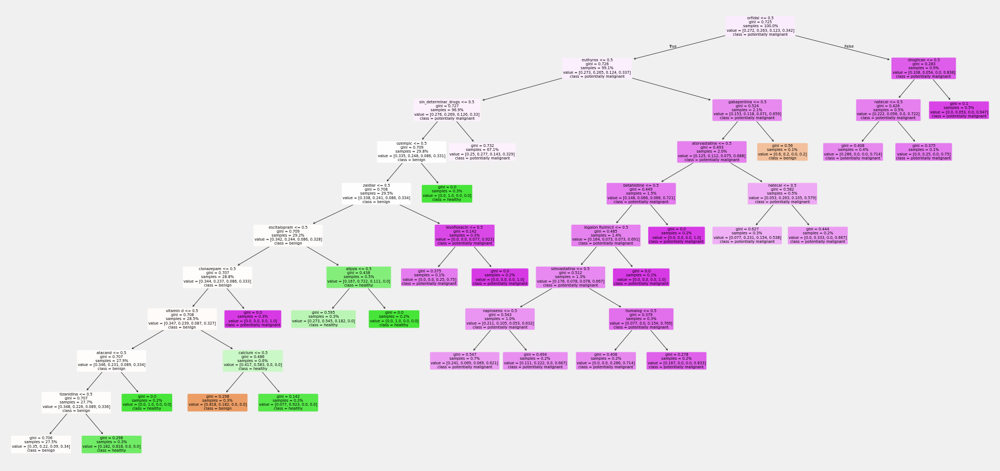

Importancia de cada medicamento:
 euthyrox                0.129468
orfidal                 0.129441
sin_determinar_drugs    0.098165
ozempic                 0.092039
zaldiar                 0.071201
escitalopram            0.070115
calcium                 0.068347
clonazepam              0.065996
atacand                 0.061050
vitamin d               0.060967
dtype: float64


In [ ]:
# Conversion de "Drugs" a variable numérica segun la importancia de cada variable dummie creada para sus niveles

# Crear variables dummy para 'Drugs'
data = datos_clinicos_transf[['Clasification', 'Drugs']]
data = crear_dummies_valores(data, 'Drugs')

# Definir X y Y
X = data.drop(['Clasification', 'Drugs'], axis=1)
y = data['Clasification']

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Tuneo de hiperparámetros usando GridSearchCV
param_grid = {
    'max_depth': [5, 6, 8, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}

grid_search = GridSearchCV(
    estimator=DecisionTreeClassifier(random_state=42),
    param_grid=param_grid,
    cv=5,
    scoring='accuracy',
    n_jobs=-1
)

grid_search.fit(X, y_encoded)

# Mejor clasificador con parámetros óptimos
best_clf = grid_search.best_estimator_

print("Mejores parámetros encontrados:", grid_search.best_params_)

# Dibujar el árbol con mejores parámetros
plt.figure(figsize=(20, 10))
plot_tree(
    best_clf,
    feature_names=X.columns,
    class_names=le.classes_,
    filled=True,
    rounded=True,
    proportion=True
)
plt.show()

# Obtenemos la importancia de cada dummy
importancias = best_clf.feature_importances_
pesos = dict(zip(X.columns, importancias))

# Creamos una nueva columna que es la suma ponderada por importancia
data = data.copy()
data['score_drugs'] = X.dot(importancias)

# Mostrar pesos ordenados
pesos_ordenados = pd.Series(pesos).sort_values(ascending=False)
print("Importancia de cada medicamento:\n", pesos_ordenados.head(10))

In [ ]:
# Funcion para obtener las clases que me acumulen el 80% de la importancia
def top_80porc_importancia(weights):
  df_weights = pd.DataFrame({'variable': weights.index, 'peso': weights.values})
  df_weights = df_weights.sort_values('peso', ascending=False)
  df_weights['suma_acumulada'] = df_weights['peso'].cumsum()
  total_sum = df_weights['peso'].sum()
  threshold = 0.8 * total_sum
  variables_80 = df_weights[df_weights['suma_acumulada'] <= threshold]['variable'].tolist()
  return variables_80

In [ ]:
# Creación de la lista de medicamentos que acumulan el 80% de la importancia
medicamentos_importantes = top_80porc_importancia(pesos_ordenados)
medicamentos_importantes

['euthyrox',
 'orfidal',
 'sin_determinar_drugs',
 'ozempic',
 'zaldiar',
 'escitalopram',
 'calcium',
 'clonazepam',
 'atacand']

  **Comorbidities**

Mejores parámetros encontrados: {'criterion': 'gini', 'max_depth': 8, 'min_samples_leaf': 4, 'min_samples_split': 2}


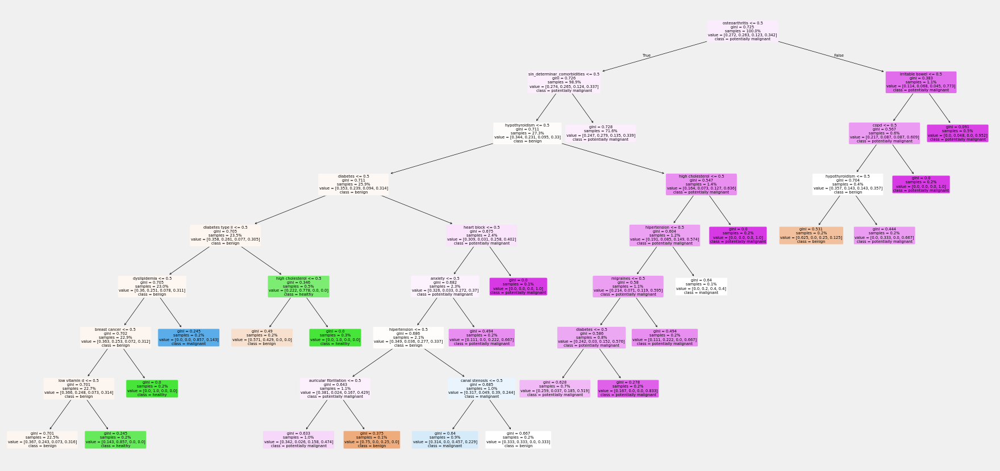

Importancia de cada comorbilidad:
 hypothyroidism                  0.139411
osteoarthritis                  0.134443
sin_determinar_comorbidities    0.124744
diabetes                        0.109943
diabetes type ii                0.083540
dyslipidemia                    0.069181
breast cancer                   0.056734
high cholesterol                0.053123
low vitamin d                   0.043861
copd                            0.037754
dtype: float64


In [ ]:
# Conversion de "Comorbidities" a variable numérica segun la importancia de cada variable dummie creada para sus niveles
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt

# Crear variables dummy para 'Comorbidities'
data = datos_clinicos_transf[['Clasification', 'Comorbidities']]
data = crear_dummies_valores(data, 'Comorbidities')

# Definir X e y
X = data.drop(['Clasification', 'Comorbidities'], axis=1)
y = data['Clasification']

# Convert y to numeric using LabelEncoder
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_encoded = le.fit_transform(y) # Store encoded labels

# Tuneo de hiperparámetros usando GridSearchCV
param_grid = {
    'max_depth': [5, 6, 8, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}

grid_search = GridSearchCV(
    estimator=DecisionTreeClassifier(random_state=42),
    param_grid=param_grid,
    cv=5,
    scoring='accuracy',
    n_jobs=-1
)

grid_search.fit(X, y_encoded) # Use encoded labels for training

# Mejor clasificador con parámetros óptimos
best_clf = grid_search.best_estimator_

print("Mejores parámetros encontrados:", grid_search.best_params_)

# Dibujar el árbol con mejores parámetros
plt.figure(figsize=(20, 10))
plot_tree(
    best_clf,
    feature_names=X.columns,
    class_names=le.classes_, # Use original class labels for plotting
    filled=True,
    rounded=True,
    proportion=True
)
plt.show()

# Obtenemos la importancia de cada dummy
importancias = best_clf.feature_importances_
pesos = dict(zip(X.columns, importancias))

# Creamos una nueva columna que es la suma ponderada por importancia
data = data.copy()
data['score_comorbidities'] = X.dot(importancias)

# Mostrar pesos ordenados
pesos_ordenados = pd.Series(pesos).sort_values(ascending=False)
print("Importancia de cada comorbilidad:\n", pesos_ordenados.head(10))

In [ ]:
# Creación de la lista de comorbilidades que acumulan el 80% de la importancia
comorbilidades_importantes = top_80porc_importancia(pesos_ordenados)
comorbilidades_importantes

['hypothyroidism',
 'osteoarthritis',
 'sin_determinar_comorbidities',
 'diabetes',
 'diabetes type ii',
 'dyslipidemia',
 'breast cancer',
 'high cholesterol']

In [ ]:
# Creo una nueva columna de agrupacion de las columnas Drugs y Comorbidities del dataframe datos_clinicos_transf
# todos los valores que no sean los que estan en el vector medicamentos importantes o el de comorbilidades importantes se reescriben como "otros", respectivamente para cada columna.
datos_clinicos_transf['Drugs_imp'] = datos_clinicos_transf['Drugs']
datos_clinicos_transf['Comorbidities_imp'] = datos_clinicos_transf['Comorbidities']

def reemplazo_columna(df, column_name, important_values):
    """
    Reemplaza en la columna especificada del DataFrame todos los valores que no estén en la lista de valores importantes por "otros".
    """
    def reemplazo(value):
        if pd.isna(value):
            return f"otros_{column_name}"  # Considerar valores nulos como "otros" + column_name

        words = [word.strip() for word in value.split(';')]
        updated_words = []

        for word in words:
            if word in important_values:
                updated_words.append(word)
            else:
                updated_words.append(f'otros_{column_name}')

        return "; ".join(updated_words)

    df[column_name] = df[column_name].apply(reemplazo)
    return df

# Reemplazar en la columna 'Drugs'
datos_clinicos_transf = reemplazo_columna(datos_clinicos_transf, 'Drugs_imp', medicamentos_importantes)

# Reemplazar en la columna 'Comorbidities'
datos_clinicos_transf = reemplazo_columna(datos_clinicos_transf, 'Comorbidities_imp', comorbilidades_importantes)


### **3.3.3  Conversión "Localization" (Localizacion) y "Colour" (Color), "Tobacco (Yes/No)(Fuma)", "Comorbidities" y "Drugs"** con One-Hot Encoding

In [ ]:
# Creacion de las columnas dummies Localizacion
len(datos_clinicos_transf['Localization'].unique()) #18
datos_clinicos_transf= crear_dummies_valores(datos_clinicos_transf, 'Localization')
datos_clinicos_transf.shape #18 a 33

# Creacion de las columnas dummies Color
len(datos_clinicos_transf['Colour'].unique()) #8
datos_clinicos_transf= crear_dummies_valores(datos_clinicos_transf, 'Colour')
datos_clinicos_transf.shape # 33, luego 40

# Creacion de las columnas dummies Fumador
len(datos_clinicos_transf['Tobacco (Yes/No)'].unique()) #2
datos_clinicos_transf= crear_dummies_valores(datos_clinicos_transf, 'Tobacco (Yes/No)')
datos_clinicos_transf.shape # 40, luego 42

(3999, 53)

In [ ]:
# Creacion de dos datasets de datos_clinicos_transf, uno que contenga las variables de crear dummies solo contemplando
# Drugs_minpac y Comorbidities_minpac y otra creando las dummies para Drugs_imp y	Comorbidities_imp. Esto para comparar el rendimiento entre ambos conjuntos de variables

datos_clinicos_transf_minpac = datos_clinicos_transf.copy()
datos_clinicos_transf_imp = datos_clinicos_transf.copy()

# Creacion de las columnas dummies Comorbilidades y Drugs
datos_clinicos_transf_minpac= crear_dummies_valores(datos_clinicos_transf_minpac, 'Comorbidities_minpac')
datos_clinicos_transf_minpac= crear_dummies_valores(datos_clinicos_transf_minpac, 'Drugs_minpac')

# Creacion de las columnas dummies Comorbilidades
datos_clinicos_transf_imp= crear_dummies_valores(datos_clinicos_transf_imp, 'Comorbidities_imp')
datos_clinicos_transf_imp= crear_dummies_valores(datos_clinicos_transf_imp, 'Drugs_imp')

In [ ]:
# Eliminacion de variables altamente correlacionadas que fueron revisadas con el experto del area para su eliminacion
# Ya sea por ser variables redundantes o de mas
datos_clinicos_transf_minpac = datos_clinicos_transf_minpac.drop(['Patient', 'Diagnosis','Localization', 'Colour',
                                                            'Unique', 'Edges_hard','Number of cigaretes/day', 'Tobacco (Yes/No)',
                                                            'Dose of alcohol/day', 'Cervical lymph nodes', 'Drugs','Comorbidities',
                                                            'Drugs_minpac','Comorbidities_minpac', 'Drugs_imp', 'Comorbidities_imp',], axis=1)
print(datos_clinicos_transf_minpac.columns)

datos_clinicos_transf_imp = datos_clinicos_transf_imp.drop(['Patient', 'Diagnosis','Localization', 'Colour',
                                                            'Unique', 'Edges_hard','Number of cigaretes/day', 'Tobacco (Yes/No)',
                                                            'Dose of alcohol/day', 'Cervical lymph nodes', 'Drugs','Comorbidities',
                                                            'Drugs_minpac','Comorbidities_minpac', 'Drugs_imp', 'Comorbidities_imp',], axis=1)
print(datos_clinicos_transf_imp.columns)

Index(['Clasification', 'Shape_regular', 'Size (mm2)', 'Multiple',
       'Indurated edges (Yes/No)', 'Exophytic', 'Ulcerated', 'Mixed',
       'Consistency_hard', 'Pain', 'Age', 'Gender_male', 'Alcohol (Yes/No)',
       'lips', 'alveolar ridge', 'tongue frenulum', 'retromolar area',
       'bottom of the vestibule', 'buccal mucosa', 'oropharynx',
       'inner side of the lip', 'palate', 'gingiva', 'tongue',
       'maxillary tuberosity', 'floor of the mouth', 'red', 'no color change',
       'pink', 'yellow', 'black', 'brown', 'white', 'blue', 'exsmoker',
       'si_fuma', 'no_fuma', 'dyslipidemia', 'depression', 'no_comorbidities',
       'osteoarthritis', 'diabetes', 'anxiety', 'hypothyroidism',
       'sin_determinar_comorbidities', 'hipertension', 'high cholesterol',
       'osteoporosis', 'otros', 'bisoprolol', 'lorazepam', 'amlodipino',
       'sintrom', 'adiro', 'omeprazol', 'sin_determinar_drugs', 'simvastatina',
       'insulin', 'orfidal', 'atorvastatina', 'no_drugs', 'tard

In [ ]:
# Preparacion de los datos
def preparar_data(df):
  X = df.drop('Clasification', axis=1)
  y = df['Clasification']
  return X, y

X_minpac, y_minpac = preparar_data(datos_clinicos_transf_minpac)
X_imp, y_imp = preparar_data(datos_clinicos_transf_imp)

# Creacion de los conjuntos Train y Test
X_train_minpac, X_test_minpac, y_train_minpac, y_test_minpac = train_test_split(
    X_minpac, y_minpac, test_size=0.3, random_state=42
)
X_train_imp, X_test_imp, y_train_imp, y_test_imp = train_test_split(
    X_imp, y_imp, test_size=0.3, random_state=42
)

# Entrenamiento de los modelos Random Forest para obtener sus predicciones
rf_minpac = RandomForestClassifier(random_state=42)
rf_minpac.fit(X_train_minpac, y_train_minpac)

rf_imp = RandomForestClassifier(random_state=42)
rf_imp.fit(X_train_imp, y_train_imp)

y_pred_minpac = rf_minpac.predict(X_test_minpac)
y_pred_imp = rf_imp.predict(X_test_imp)

# Comparativa de las matrices de confusion
def evaluate_model(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    print("Confusion Matrix:\n", cm)
    print("\nClassification Report:\n", classification_report(y_true, y_pred))


print("Random Forest (minpac):")
evaluate_model(y_test_minpac, y_pred_minpac)

print("\nRandom Forest (imp):")
evaluate_model(y_test_imp, y_pred_imp)


Random Forest (minpac):
Confusion Matrix:
 [[286   1   5  30]
 [  0 309   0   1]
 [  9   2  83  56]
 [ 46   0   3 369]]

Classification Report:
                        precision    recall  f1-score   support

               benign       0.84      0.89      0.86       322
              healthy       0.99      1.00      0.99       310
            malignant       0.91      0.55      0.69       150
potentially malignant       0.81      0.88      0.84       418

             accuracy                           0.87      1200
            macro avg       0.89      0.83      0.85      1200
         weighted avg       0.88      0.87      0.87      1200


Random Forest (imp):
Confusion Matrix:
 [[287   1   5  29]
 [  0 309   0   1]
 [  9   2  84  55]
 [ 45   0   3 370]]

Classification Report:
                        precision    recall  f1-score   support

               benign       0.84      0.89      0.87       322
              healthy       0.99      1.00      0.99       310
            mal


## **3.4 Análisis unicamente de Datos Clinicos**

In [ ]:
# Creacion del dataset transformado para utilizar solo datos de pacientes para incluir clase Healthy
# Deberia eliminar 'Dose of alcohol/day',, 'Number of cigaretes/day', por su presencia de nulos de mas del 90%
# y y 'Diagnosis' por ser lo mismo que la clasificacion

datos_clinicos_transf_cli = datos_clinicos_filtrado.copy()
#datos_clinicos_transf_cli = datos_clinicos_transf
#datos_clinicos_transf_cli = datos_clinicos_transf_cli[[ 'Clasification', 'Age', 'Gender_male', 'Tobacco (Yes/No)','Alcohol (Yes/No)', 'Drugs', 'Comorbidities']]
#datos_clinicos_transf_cli.dropna() # Si elimino baja a 1368. NO HACEMOS ESTA ACCION

In [ ]:
datos_clinicos_filtrado.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3999 entries, 0 to 7428
Data columns (total 25 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Patient                   3999 non-null   object 
 1   Diagnosis                 3999 non-null   object 
 2   Clasification             3999 non-null   object 
 3   Localization              3995 non-null   object 
 4   Shape_regular             2263 non-null   object 
 5   Colour                    2262 non-null   object 
 6   Size (mm2)                2262 non-null   float64
 7   Unique                    2263 non-null   object 
 8   Multiple                  2263 non-null   object 
 9   Edges_hard                2263 non-null   object 
 10  Indurated edges (Yes/No)  2263 non-null   object 
 11  Exophytic                 2263 non-null   object 
 12  Ulcerated                 2263 non-null   object 
 13  Mixed                     2262 non-null   object 
 14  Consistency_h

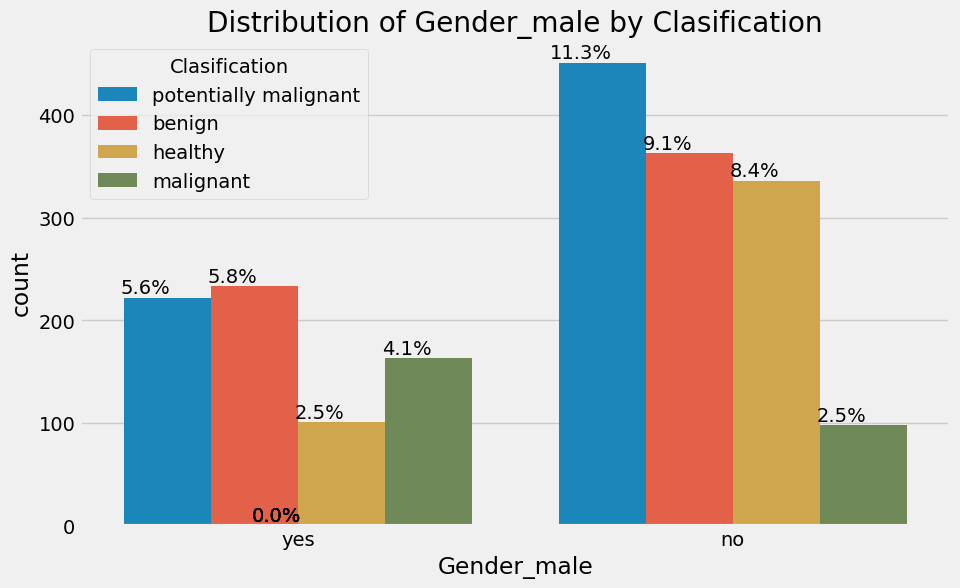

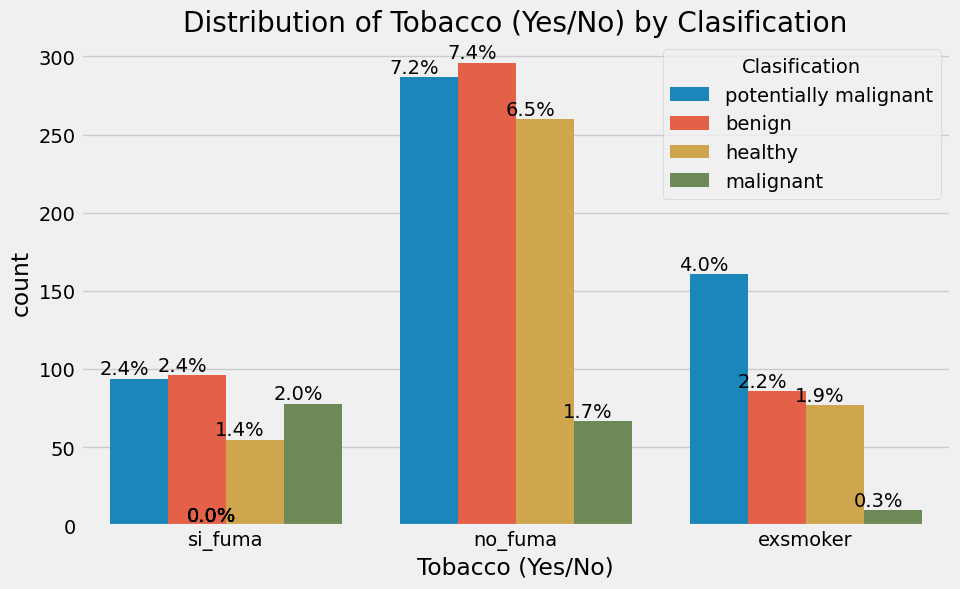

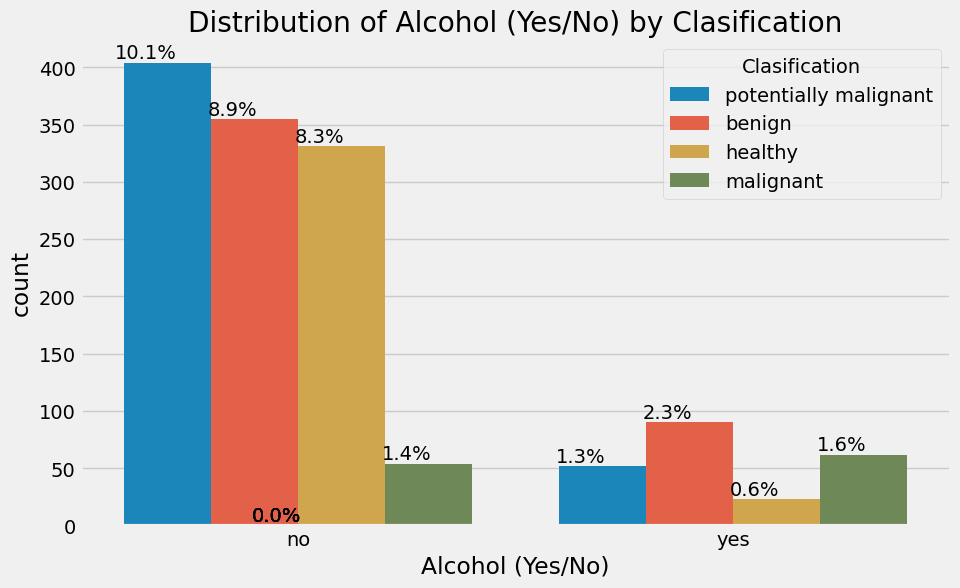

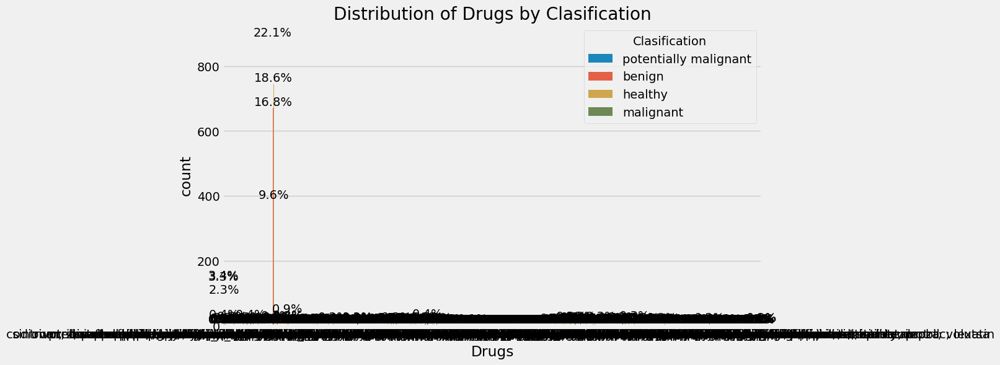

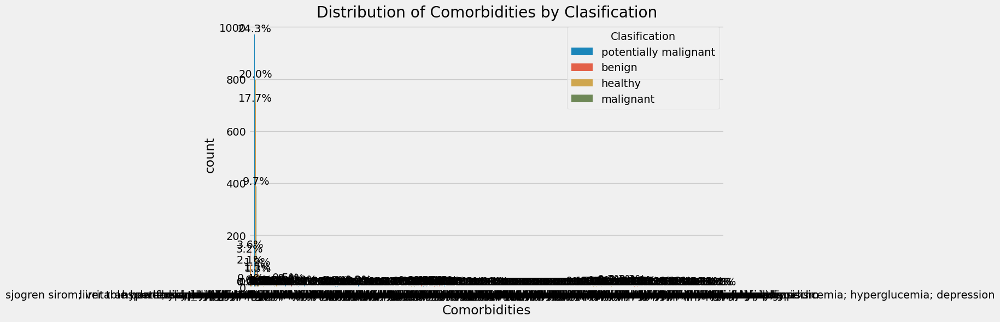

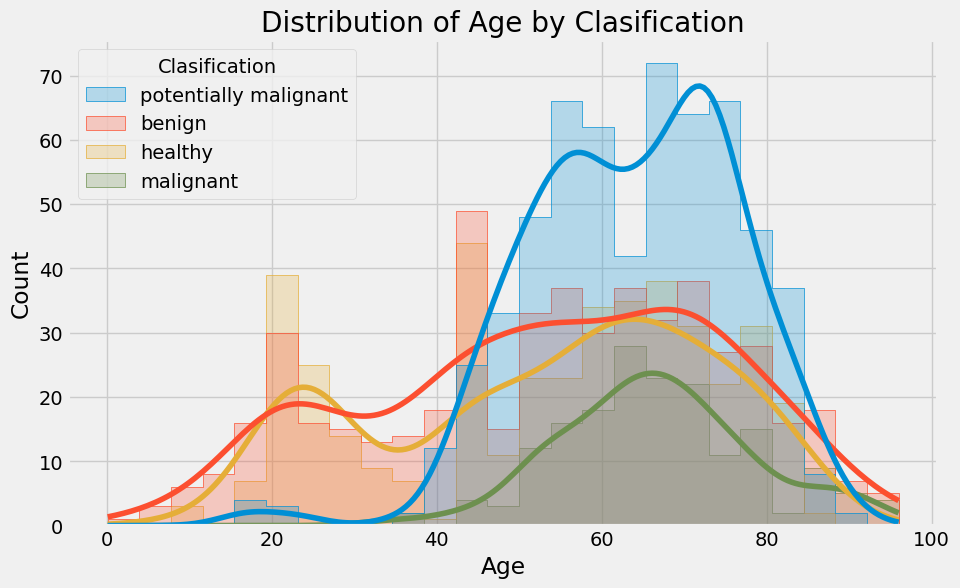

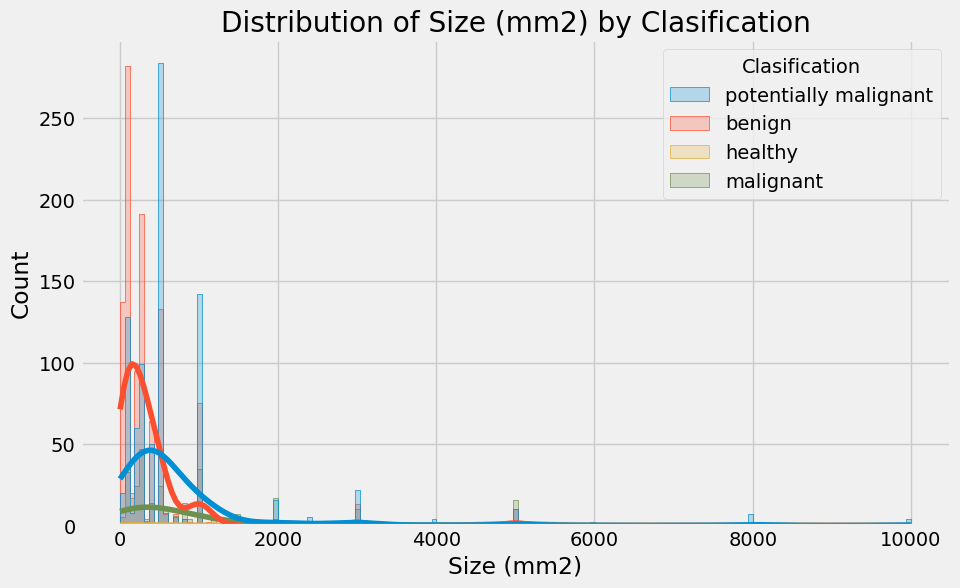

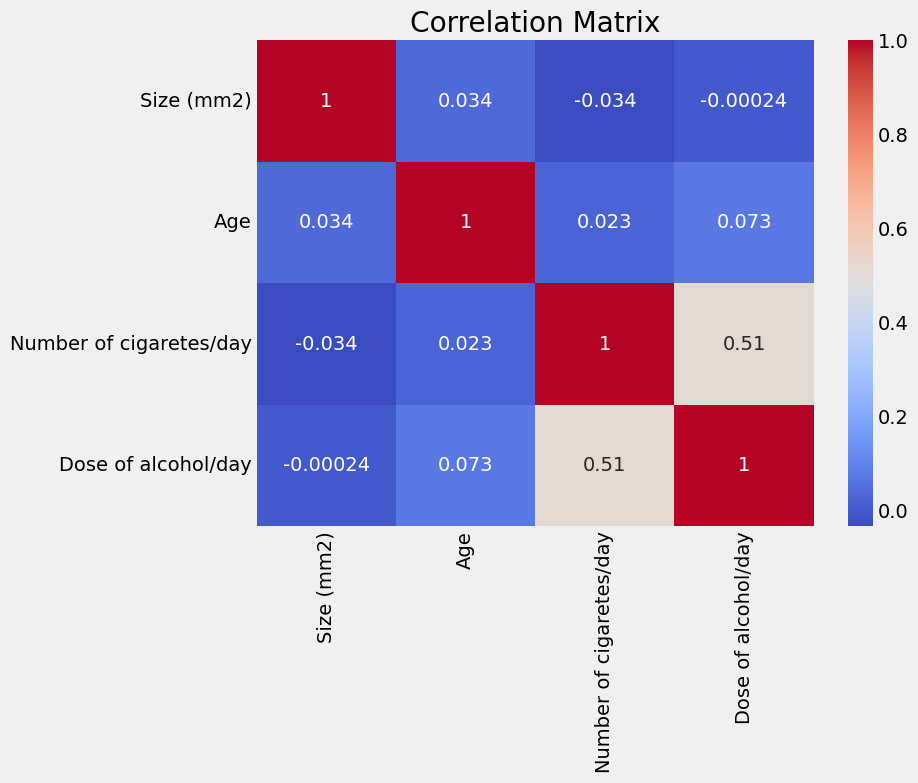

In [ ]:
def grafico_barras_con_porcentaje(df, column, hue=None, title=None):
    plt.figure(figsize=(10, 6))
    ax = sns.countplot(data=df, x=column, hue=hue)
    total = len(df[column])
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + p.get_height()
        ax.annotate(percentage, (x, y), ha='center', va='bottom')
    if title:
        plt.title(title)
    plt.show()

# Variables categoricas
for col in ['Gender_male', 'Tobacco (Yes/No)', 'Alcohol (Yes/No)', 'Drugs', 'Comorbidities']:
    grafico_barras_con_porcentaje(datos_clinicos_transf_cli, col, hue='Clasification', title=f'Distribution of {col} by Clasification')

# Edad
plt.figure(figsize=(10, 6))
sns.histplot(data=datos_clinicos_transf_cli, x='Age', hue='Clasification', kde=True, element="step")
plt.title('Distribution of Age by Clasification')
plt.show()

# Size
plt.figure(figsize=(10, 6))
sns.histplot(data=datos_clinicos_transf_cli, x='Size (mm2)', hue='Clasification', kde=True, element="step")
plt.title('Distribution of Size (mm2) by Clasification')
plt.show()

correlation_matrix = datos_clinicos_transf_cli.select_dtypes(include=['number']).corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


## **3.5 Anáisis de Datos Clinicos más Imágenes**

In [ ]:
# Creacion del dataset transformado para utilizar datos de imagenes y de pacientes
datos_clinicos_transf_cli_imag = datos_clinicos_transf_imp.copy()

In [ ]:
# Eliminacion del nivel "Healthy" para trabajar unicamente con categorias con imagenes
datos_clinicos_transf_cli_imag = datos_clinicos_transf_cli_imag[datos_clinicos_transf_cli_imag['Clasification'] != 'healthy']

In [ ]:
# Eliminación de registros con NA's puesto que queremos interpretar que variables son las que influyen y al imputarlas podriamos generar sesgos
datos_clinicos_transf_cli_imag = datos_clinicos_transf_cli_imag.dropna()
datos_clinicos_transf_cli_imag.info()   # 1005 observaciones y 54 columnas

<class 'pandas.core.frame.DataFrame'>
Index: 1005 entries, 0 to 6733
Data columns (total 56 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Clasification                 1005 non-null   object 
 1   Shape_regular                 1005 non-null   float64
 2   Size (mm2)                    1005 non-null   float64
 3   Multiple                      1005 non-null   float64
 4   Indurated edges (Yes/No)      1005 non-null   float64
 5   Exophytic                     1005 non-null   float64
 6   Ulcerated                     1005 non-null   float64
 7   Mixed                         1005 non-null   float64
 8   Consistency_hard              1005 non-null   float64
 9   Pain                          1005 non-null   float64
 10  Age                           1005 non-null   float64
 11  Gender_male                   1005 non-null   float64
 12  Alcohol (Yes/No)              1005 non-null   float64
 13  lips    

# **4. Selección de Variables**

## **4.1. Creación del dataframe para modelado**

In [ ]:
# Eliminacion de variables originales sin transformar
datos_clinicos_modelo = datos_clinicos_transf_cli_imag.copy()

In [ ]:
# Proceso de escalar las variables numericas, Size y Age
colummnas_escalar = ['Size (mm2)', 'Age']
scaler = MinMaxScaler()
datos_clinicos_modelo[colummnas_escalar] = scaler.fit_transform(datos_clinicos_modelo[colummnas_escalar])

## **4.2. Feature Selection utilizando varios métodos y contrastando su resultado**

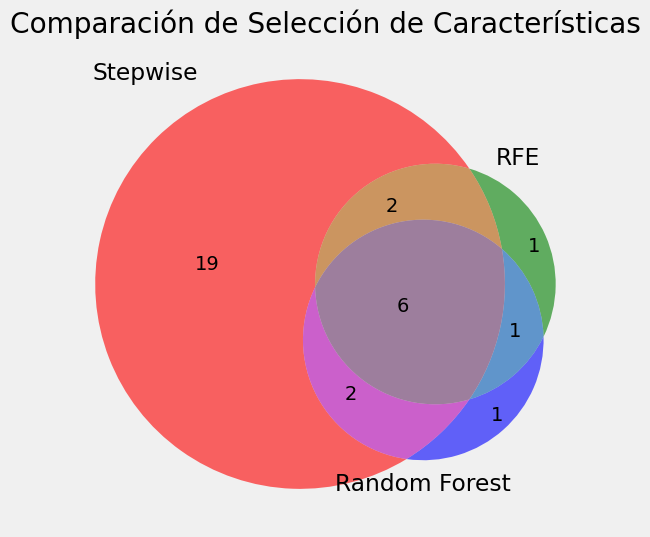

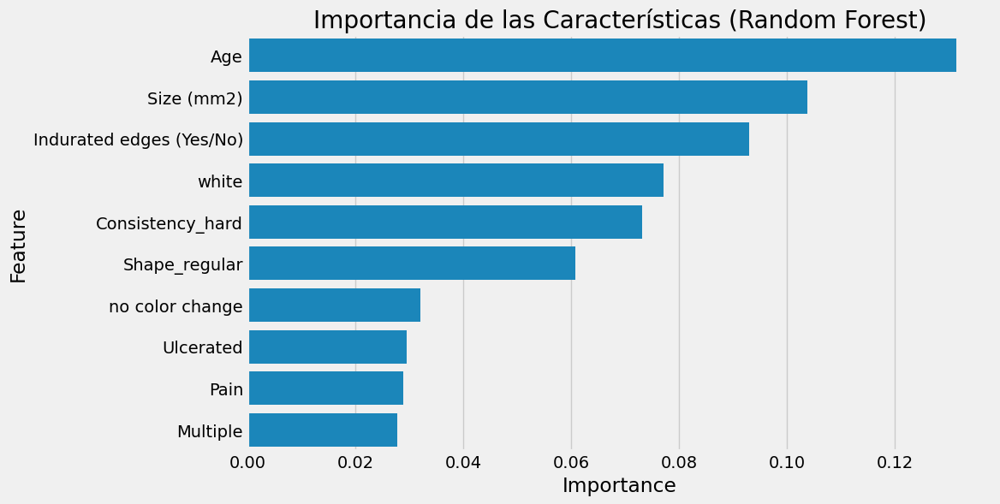

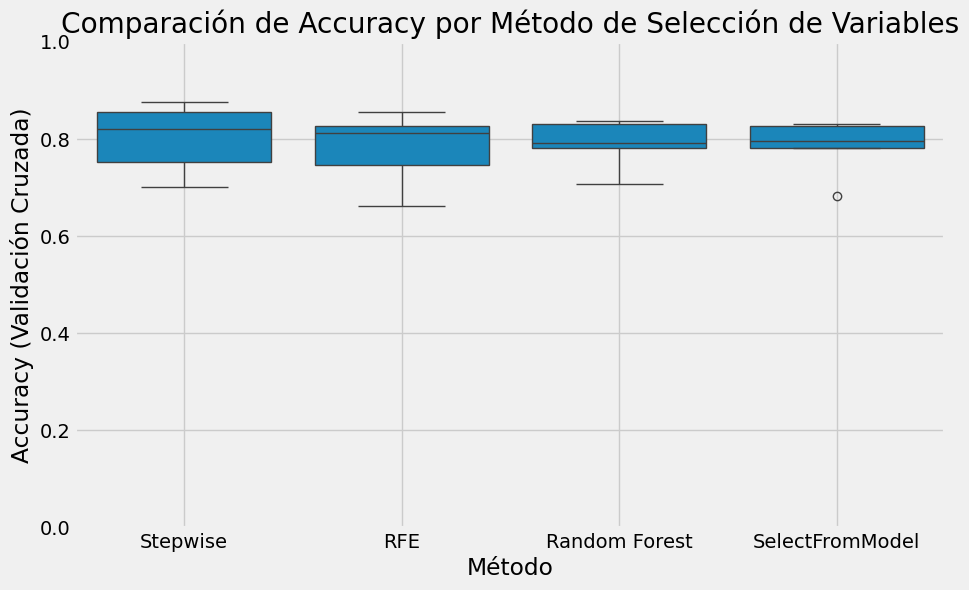

Stepwise: media=0.8010, std=0.0653
RFE: media=0.7801, std=0.0692
Random Forest: media=0.7891, std=0.0465
SelectFromModel: media=0.7831, std=0.0540


In [ ]:
# Separar variables dependientes e independientes
X = datos_clinicos_modelo.drop('Clasification', axis=1)
y = datos_clinicos_modelo['Clasification']

# Asegurar que X esté limpio
X = pd.get_dummies(X, drop_first=True)
X = X.fillna(0)

# Codificar la variable objetivo
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Añadir constante para Stepwise
X_with_const = sm.add_constant(X)

# 1. Stepwise Selection (Backward Elimination)
def backward_elimination(X, y, significance_level=0.05):
    num_vars = len(X.columns)
    while num_vars > 0:
        model = sm.OLS(y, X).fit()
        max_p_value = max(model.pvalues)
        if max_p_value > significance_level:
            excluded_feature = model.pvalues.idxmax()
            X = X.drop(columns=[excluded_feature])
            num_vars -= 1
        else:
            break
    return X
X_stepwise = backward_elimination(X_with_const.copy(), y_encoded)

# 2. Recursive Feature Elimination (RFE)
clf_rfe = DecisionTreeClassifier(random_state=42)
selector_rfe = RFE(estimator=clf_rfe, n_features_to_select=10)
selector_rfe = selector_rfe.fit(X, y_encoded)
X_rfe = X.loc[:, selector_rfe.support_]

# 3. Random Forest Importance
clf_rf = RandomForestClassifier(random_state=42)
clf_rf.fit(X, y_encoded)
importances = clf_rf.feature_importances_
importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)
X_rf = X[importance_df['Feature'].head(10)]

# 4. SelectFromModel
selector_sf = SelectFromModel(clf_rf, threshold="mean", max_features=10)
selector_sf.fit(X, y_encoded)
X_sf = X.loc[:, selector_sf.get_support()]

# Comparar características seleccionadas
stepwise_features = set(X_stepwise.columns)
rfe_features = set(X_rfe.columns)
rf_features = set(X_rf.columns)
sf_features = set(X_sf.columns)

# Diagrama de Venn
plt.figure(figsize=(10, 6))
venn3([stepwise_features, rfe_features, rf_features], set_labels=('Stepwise', 'RFE', 'Random Forest'), alpha=0.6)
plt.title("Comparación de Selección de Características")
plt.show()

# Gráfico de Importancia
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importance_df.head(10))
plt.title('Importancia de las Características (Random Forest)')
plt.show()

# --------------- Comparación del Error ---------------- #
from sklearn.model_selection import cross_val_score

def evaluar_modelo(X_subset, y, modelo=RandomForestClassifier(random_state=42), cv=5):
    scores = cross_val_score(modelo, X_subset, y, cv=cv, scoring='accuracy')
    return scores

# Evaluar cada conjunto
errores_modelos = {
    'Stepwise': evaluar_modelo(X_stepwise.drop(columns='const', errors='ignore'), y_encoded),
    'RFE': evaluar_modelo(X_rfe, y_encoded),
    'Random Forest': evaluar_modelo(X_rf, y_encoded),
    'SelectFromModel': evaluar_modelo(X_sf, y_encoded)
}

# Convertir a DataFrame para visualización
df_errores = pd.DataFrame(errores_modelos)
df_errores_melted = df_errores.melt(var_name='Método', value_name='Accuracy')

# Diagrama de caja
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_errores_melted, x='Método', y='Accuracy')
plt.title('Comparación de Accuracy por Método de Selección de Variables')
plt.ylabel('Accuracy (Validación Cruzada)')
plt.ylim(0, 1)
plt.grid(True)
plt.show()

# Mostrar métricas en consola
for metodo, scores in errores_modelos.items():
    print(f"{metodo}: media={scores.mean():.4f}, std={scores.std():.4f}")


In [ ]:
# Selección de variables más relevantes para entrenamiento de modelos
variables_seleccionadas = sf_features.union(rfe_features).union(rf_features).union(stepwise_features)
variables_seleccionadas= ['Clasification']+list(variables_seleccionadas)
variables_seleccionadas

['Clasification',
 'exsmoker',
 'red',
 'sin_determinar_comorbidities',
 'si_fuma',
 'clonazepam',
 'calcium',
 'Consistency_hard',
 'retromolar area',
 'no color change',
 'orfidal',
 'no_fuma',
 'zaldiar',
 'ozempic',
 'Pain',
 'white',
 'blue',
 'diabetes type ii',
 'Multiple',
 'Indurated edges (Yes/No)',
 'Ulcerated',
 'Shape_regular',
 'Exophytic',
 'atacand',
 'brown',
 'high cholesterol',
 'buccal mucosa',
 'Gender_male',
 'Size (mm2)',
 'Age',
 'gingiva',
 'euthyrox',
 'floor of the mouth']

# **5. Modelado y Evaluación**

## **5.1. Definición de conjunto de entrenamiento y prueba**

In [ ]:
datos_clinicos_modelo = datos_clinicos_modelo[variables_seleccionadas]

In [ ]:
#benign (0) - malignant (1)- potentially malignant (2)
datos_clinicos_modelo['Clasification'].value_counts()

,count
Clasification,
potentially malignant,453
benign,438
malignant,114


In [ ]:
datos_clinicos_modelo['Clasification'] = pd.Categorical(datos_clinicos_modelo['Clasification'], categories=['benign', 'potentially malignant', 'malignant'])

# Division de variables independientes (X) y dependiente (y)
X = datos_clinicos_modelo.drop('Clasification', axis=1)
y = datos_clinicos_modelo['Clasification']

# Division de conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

## **5.2. Ajuste de Modelos Xgboost, Random Forest y Catboost**

### **5.2.1 Modelo Random Forest**

Fitting 5 folds for each of 64 candidates, totalling 320 fits
Mejores parámetros para Random Forest: {'bootstrap': False, 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 200}


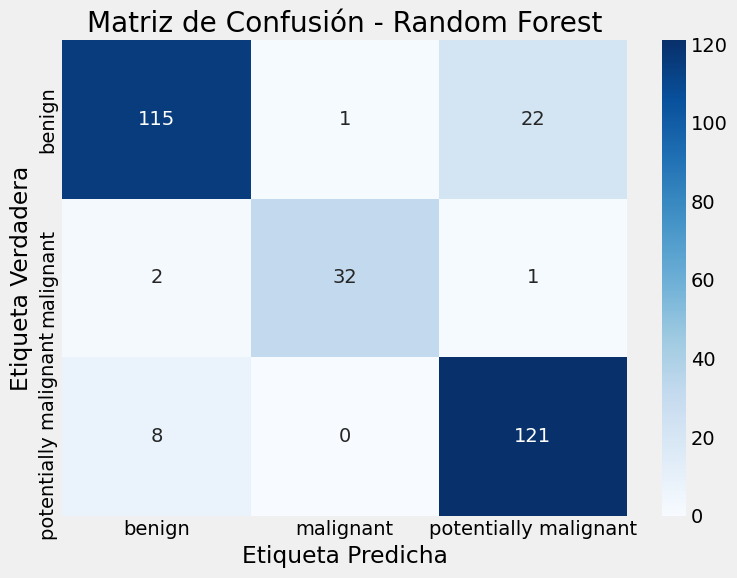

Reporte de clasificación para Random Forest:
                       precision    recall  f1-score   support

               benign       0.92      0.83      0.87       138
            malignant       0.97      0.91      0.94        35
potentially malignant       0.84      0.94      0.89       129

             accuracy                           0.89       302
            macro avg       0.91      0.90      0.90       302
         weighted avg       0.89      0.89      0.89       302



In [ ]:
# Inicio el clasificador con semilla para reproducibilidad
rf = RandomForestClassifier(random_state=42)

# Definicion el espacio de hiperparámetros para GridSearch
param_grid_rf = {
    'n_estimators': [100, 200],
    'max_depth': [5, 10, 15, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'bootstrap': [True, False]
}
# Codificar etiquetas
le = LabelEncoder()
y_train_enc = le.fit_transform(y_train)
y_test_enc = le.transform(y_test)

# Inicio GridSearchCV
grid_search_rf = GridSearchCV(estimator=rf, param_grid=param_grid_rf, cv=5, n_jobs=-1, verbose=2, scoring='accuracy')

# Ajuste del modelo
grid_search_rf.fit(X_train, y_train_enc)

# Mejor conjunto de hiperparámetros
print("Mejores parámetros para Random Forest:", grid_search_rf.best_params_)

# Predicciones
y_pred_rf = grid_search_rf.best_estimator_.predict(X_test)

# Matriz de confusión
cm_rf = confusion_matrix(y_test_enc, y_pred_rf)
plt.figure(figsize=(8,6))
sns.heatmap(cm_rf, annot=True, fmt='d', cmap='Blues',
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.title("Matriz de Confusión - Random Forest")
plt.xlabel("Etiqueta Predicha")
plt.ylabel("Etiqueta Verdadera")
plt.tight_layout()
plt.show()

# Reporte de clasificación
print("Reporte de clasificación para Random Forest:")
print(classification_report(y_test_enc, y_pred_rf, target_names=le.classes_))

### **5.2.2 Modelo XgBoost**

Fitting 5 folds for each of 48 candidates, totalling 240 fits
Mejores parámetros para XGBoost: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 100, 'subsample': 0.8}


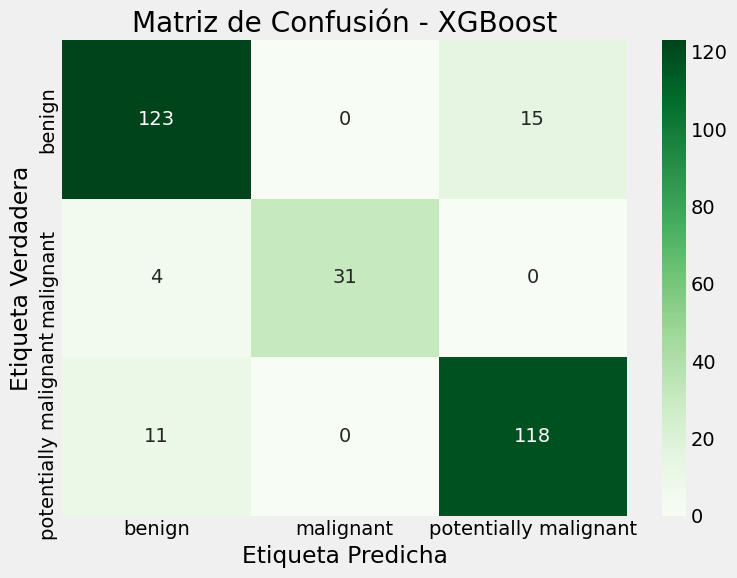

Reporte de clasificación para XGBoost:
                       precision    recall  f1-score   support

               benign       0.89      0.89      0.89       138
            malignant       1.00      0.89      0.94        35
potentially malignant       0.89      0.91      0.90       129

             accuracy                           0.90       302
            macro avg       0.93      0.90      0.91       302
         weighted avg       0.90      0.90      0.90       302



In [ ]:
# Inicio del clasificador
xgb = XGBClassifier(random_state=42, use_label_encoder=False)

# Definicion del espacio de hiperparámetros para GridSearch
param_grid_xgb = {
    'n_estimators': [100, 200],
    'max_depth': [3, 6, 10],
    'learning_rate': [0.01, 0.1],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# Inicio de GridSearchCV
grid_search_xgb = GridSearchCV(estimator=xgb, param_grid=param_grid_xgb, cv=5, n_jobs=-1, verbose=2, scoring='accuracy')

# Codificacion de la variable objetivo
le = LabelEncoder()
y_train_encodedxgb = le.fit_transform(y_train)
y_test_encodedxgb = le.transform(y_test)

# Ajuste del modelo usando los datos codificados
grid_search_xgb.fit(X_train, y_train_encodedxgb)

# Mejor conjunto de hiperparámetros
print("Mejores parámetros para XGBoost:", grid_search_xgb.best_params_)

# Predicciones, usando datos codificados
y_pred_xgb = grid_search_xgb.best_estimator_.predict(X_test)

# Matriz de confusión
cm_xgb = confusion_matrix(y_test_encodedxgb, y_pred_xgb)
plt.figure(figsize=(8,6))
sns.heatmap(cm_xgb, annot=True, fmt='d', cmap='Greens',
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.title("Matriz de Confusión - XGBoost")
plt.xlabel("Etiqueta Predicha")
plt.ylabel("Etiqueta Verdadera")
plt.tight_layout()
plt.show()

# Reporte de clasificación, decodificar las predicciones para el reporte
print("Reporte de clasificación para XGBoost:")
print(classification_report(y_test_encodedxgb, y_pred_xgb, target_names=le.classes_))

### **5.2.3 Modelo CatBoost**

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Mejores parámetros para CatBoost: {'learning_rate': 0.1, 'l2_leaf_reg': 3, 'iterations': 200, 'depth': 6, 'border_count': 50, 'bagging_temperature': 0.5}


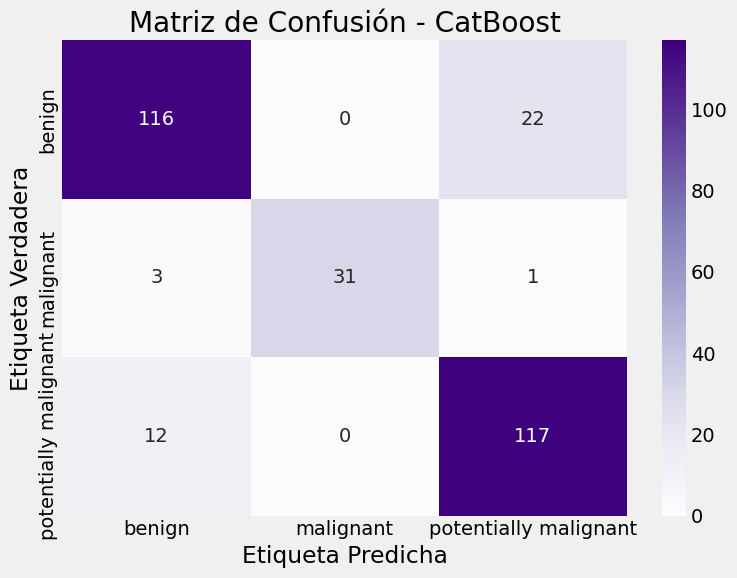

Reporte de clasificación para CatBoost:
                       precision    recall  f1-score   support

               benign       0.89      0.84      0.86       138
            malignant       1.00      0.89      0.94        35
potentially malignant       0.84      0.91      0.87       129

             accuracy                           0.87       302
            macro avg       0.91      0.88      0.89       302
         weighted avg       0.88      0.87      0.87       302



In [ ]:
# Inicializar el clasificador
catboost = CatBoostClassifier(random_state=42, verbose=0)

# Definir el espacio de hiperparámetros para RandomizedSearch
param_dist_catboost = {
    'iterations': [100, 200],  # Número de iteraciones (reducido)
    'depth': [6, 8, 10],  # Profundidad del árbol
    'learning_rate': [0.05, 0.1],  # Tasa de aprendizaje
    'l2_leaf_reg': [3, 5],  # Regularización L2
    'border_count': [32, 50],  # Número de límites para las características continuas
    'bagging_temperature': [0.1, 0.5]  # Temperatura de muestreo para el bagging
}

# Inicio de RandomizedSearchCV
random_search_catboost = RandomizedSearchCV(estimator=catboost, param_distributions=param_dist_catboost,
                                            n_iter=10, cv=3, n_jobs=-1, verbose=2, scoring='accuracy', random_state=42)

# Codificacion la variable objetivo
le = LabelEncoder()
y_train_encodedcb = le.fit_transform(y_train)
y_test_encodedcb = le.transform(y_test)

# Ajuste del modelo usando los datos codificados
random_search_catboost.fit(X_train, y_train_encodedcb)

# Mejor conjunto de hiperparámetros
print("Mejores parámetros para CatBoost:", random_search_catboost.best_params_)

# Predicciones
y_pred_catboost = random_search_catboost.best_estimator_.predict(X_test)

# Matriz de confusión visual para CatBoost
cm_catboost = confusion_matrix(y_test_encodedcb, y_pred_catboost)

plt.figure(figsize=(8,6))
sns.heatmap(cm_catboost, annot=True, fmt='d', cmap='Purples',
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.title("Matriz de Confusión - CatBoost")
plt.xlabel("Etiqueta Predicha")
plt.ylabel("Etiqueta Verdadera")
plt.tight_layout()
plt.show()

# Reporte de clasificación
print("Reporte de clasificación para CatBoost:")
print(classification_report(y_test_encodedcb, y_pred_catboost, target_names=le.classes_))

### **5.2.4 Modelo CatBoost sin transformar las variables categoricas**

In [ ]:
datos_clinicos_catboost_modelo = datos_clinicos_catboost.copy()

In [ ]:
datos_clinicos_catboost_modelo = datos_clinicos_catboost_modelo.drop(['Patient', 'Diagnosis','Unique', 'Edges_hard','Number of cigaretes/day',
                                                                      'Dose of alcohol/day', 'Cervical lymph nodes'], axis=1)
datos_clinicos_catboost_modelo = datos_clinicos_catboost_modelo[datos_clinicos_catboost_modelo['Clasification'] != 'healthy']
# Seleccion de las columnas a escalar y aplico la transformacion
colummnas_escalar = ['Size (mm2)', 'Age']
scaler = MinMaxScaler()
datos_clinicos_catboost_modelo[colummnas_escalar] = scaler.fit_transform(datos_clinicos_catboost_modelo[colummnas_escalar])

In [ ]:
datos_clinicos_catboost_modelo.dropna(inplace=True)

In [ ]:
# Definicion de las variables categoricas input
#cat_features = ['Localization', 'Shape_regular', 'Colour','Multiple', 'Indurated edges (Yes/No)', 'Exophytic','Ulcerated',
#                'Mixed', 'Consistency_hard', 'Pain', 'Gender_male','Tobacco (Yes/No)', 'Alcohol (Yes/No)', 'Drugs', 'Comorbidities']
cat_features = ['Localization', 'Colour','Tobacco (Yes/No)', 'Drugs', 'Comorbidities']

# Transformacion de la variable categorica target
datos_clinicos_catboost_modelo['Clasification'] = pd.Categorical(
    datos_clinicos_catboost_modelo['Clasification'],
    categories=['benign', 'potentially malignant', 'malignant'])

# Definicion del conjunto de entrenamiento y el conjunto de prueba
X_catboost2 = datos_clinicos_catboost_modelo.drop('Clasification', axis=1)
y_catboost2 = datos_clinicos_catboost_modelo['Clasification']
X_train_catboost2, X_test_catboost2, y_train_catboost2, y_test_catboost2 = train_test_split(X_catboost2, y_catboost2, test_size=0.3, random_state=42)


# Inicio del clasificador
catboost2 = CatBoostClassifier(random_state=42, verbose=0)

# Definicion el espacio de hiperparámetros
param_dist_catboost2 = {
    'iterations': [100, 200],  # Número de iteraciones (reducido)
    'depth': [6, 8, 10],  # Profundidad del árbol
    'learning_rate': [0.05, 0.1],  # Tasa de aprendizaje
    'l2_leaf_reg': [3, 5],  # Regularización L2
    'border_count': [32, 50],  # Número de límites para las características continuas
    'bagging_temperature': [0.1, 0.5]  # Temperatura de muestreo para el bagging
}

# RandomizedSearchCV
random_search_catboost2 = RandomizedSearchCV(estimator=catboost2, param_distributions=param_dist_catboost2,
                                            n_iter=10, cv=3, n_jobs=-1, verbose=2,scoring='accuracy', random_state=42)

# Codificacion la variable objetivo
le = LabelEncoder()
y_train_encoded2 = le.fit_transform(y_train_catboost2)
y_test_encoded2 = le.transform(y_test_catboost2)

# Ajuste del modelo incluyendo las variables categóricas
random_search_catboost2.fit(X_train_catboost2, y_train_encoded2, cat_features=cat_features)

# Predicciones
y_pred_catboost2 = random_search_catboost2.best_estimator_.predict(X_test_catboost2)

# Mejor conjunto de hiperparámetros
print("Mejores parámetros para CatBoost sin transformar:", random_search_catboost2.best_params_)

# Matriz de confusión
cm_catboost2 = confusion_matrix(y_test_encoded2, y_pred_catboost2)
print("Matriz de confusión para CatBoost sin transformar:")
print(cm_catboost2)

# Reporte de clasificación
print("Reporte de clasificación para CatBoosst sin transformar:")
print(classification_report(y_test_encoded2, y_pred_catboost2, target_names=le.classes_))

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Mejores parámetros para CatBoost sin transformar: {'learning_rate': 0.1, 'l2_leaf_reg': 3, 'iterations': 200, 'depth': 10, 'border_count': 32, 'bagging_temperature': 0.5}
Matriz de confusión para CatBoost sin transformar:
[[109   1  20]
 [  3  37   0]
 [  8   0 123]]
Reporte de clasificación para CatBoosst sin transformar:
                       precision    recall  f1-score   support

               benign       0.91      0.84      0.87       130
            malignant       0.97      0.93      0.95        40
potentially malignant       0.86      0.94      0.90       131

             accuracy                           0.89       301
            macro avg       0.91      0.90      0.91       301
         weighted avg       0.90      0.89      0.89       301



## **5.3. Comparación de Modelos Xgboost, Random Forest y Catboost**

## **5.3.1 Comparativo Datos Train**

In [ ]:
# Codificacion de etiquetas para la evaluación
le = LabelEncoder()
y_train_enc = le.fit_transform(y_train)
y_test_enc = le.transform(y_test)

# Lista de modelos ajustados
models = [
    ('Random Forest', grid_search_rf.best_estimator_),
    ('XGBoost', grid_search_xgb.best_estimator_),
    ('CatBoost', random_search_catboost.best_estimator_)
]

# Preparacion del DataFrame de resultados
results_df = pd.DataFrame(columns=['Algorithm', 'ROC AUC Mean', 'ROC AUC STD', 'Accuracy Mean', 'Accuracy STD'])

# Validación cruzada
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

for name, model in models:
    # Accuracy
    acc_scores = cross_val_score(model, X_train, y_train_enc, cv=kfold, scoring='accuracy')

    # ROC AUC (multiclase, ovr)
    try:
        auc_scores = cross_val_score(model, X_train, y_train_enc, cv=kfold, scoring='roc_auc_ovr')
    except:
        auc_scores = [np.nan] * 5  # En caso de que no tenga predict_proba

    # Agregar resultados
    results_df = pd.concat([results_df, pd.DataFrame([{
        'Algorithm': name,
        'ROC AUC Mean': round(np.nanmean(auc_scores) * 100, 2),
        'ROC AUC STD': round(np.nanstd(auc_scores) * 100, 2),
        'Accuracy Mean': round(np.mean(acc_scores) * 100, 2),
        'Accuracy STD': round(np.std(acc_scores) * 100, 2)
    }])], ignore_index=True)

# Modelos ordenados por mejor AUC
results_df.sort_values(by='ROC AUC Mean', ascending=False, inplace=True)
results_df.reset_index(drop=True, inplace=True)

# Mostrar resultados
results_df


,Algorithm,ROC AUC Mean,ROC AUC STD,Accuracy Mean,Accuracy STD
0,Random Forest,95.90,1.20,89.05,3.29
1,CatBoost,95.80,1.17,88.05,2.51
2,XGBoost,95.69,0.97,88.76,0.52


## **5.3.2 Comparativo Datos Test**

In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score
import pandas as pd
import numpy as np

# Codificación de etiquetas
le = LabelEncoder()
y_train_enc = le.fit_transform(y_train)
y_test_enc = le.transform(y_test)

# Lista de modelos entrenados
models = [
    ('Random Forest', grid_search_rf.best_estimator_),
    ('XGBoost', grid_search_xgb.best_estimator_),
    ('CatBoost', random_search_catboost.best_estimator_)
]

# DataFrame de resultados
results_test_df = pd.DataFrame(columns=['Algorithm', 'ROC AUC', 'Accuracy'])

for name, model in models:
    # Predicción de clases y probabilidades
    y_pred = model.predict(X_test)

    # ROC AUC requiere probabilidades
    try:
        y_proba = model.predict_proba(X_test)
        roc_auc = roc_auc_score(y_test_enc, y_proba, multi_class='ovr', average='macro')
    except AttributeError:
        roc_auc = np.nan  # Si no soporta predict_proba

    # Accuracy
    accuracy = accuracy_score(y_test_enc, y_pred)

    # Agregar al DataFrame
    results_test_df = pd.concat([results_test_df, pd.DataFrame([{
        'Algorithm': name,
        'ROC AUC': round(roc_auc, 2) if not np.isnan(roc_auc) else 'N/A',
        'Accuracy': round(accuracy, 2)
    }])], ignore_index=True)

# Ordenar por ROC AUC
results_test_df.sort_values(by='ROC AUC', ascending=False, inplace=True, ignore_index=True)

# Mostrar resultados
print("Comparación de modelos en el conjunto de prueba:")
display(results_test_df)


Comparación de modelos en el conjunto de prueba:


,Algorithm,ROC AUC,Accuracy
0,XGBoost,0.98,0.90
1,Random Forest,0.97,0.89
2,CatBoost,0.97,0.87


# **6. Interpretabilidad**

In [ ]:
# Caracteristicas de la instancia a utilizar
Instancia = X_test.iloc[[5]]
datos_clinicos_transf_cli_imag.loc[Instancia.index.values[0]]

,2160
Clasification,potentially malignant
Shape_regular,0.0
Size (mm2),400.0
Multiple,1.0
Indurated edges (Yes/No),0.0
Exophytic,0.0
Ulcerated,0.0
Mixed,0.0
Consistency_hard,0.0
Pain,0.0


In [ ]:
X_test_row = X_test.iloc[[5]]

df_result = pd.DataFrame({
    'Nombre Columna': X_test_row.columns,
    'Valor': X_test_row.values[0]
})

df_result

,Nombre Columna,Valor
0,exsmoker,1.000000
1,red,1.000000
2,sin_determinar_comorbidities,1.000000
3,si_fuma,0.000000
4,clonazepam,0.000000
5,calcium,0.000000
6,Consistency_hard,0.000000
7,retromolar area,0.000000
8,no color change,0.000000
9,orfidal,0.000000


## **6.1 SHAP**

### **6.2.1 Interpretacion global**


RANDOM FOREST: Importancia de Variables (SHAP)


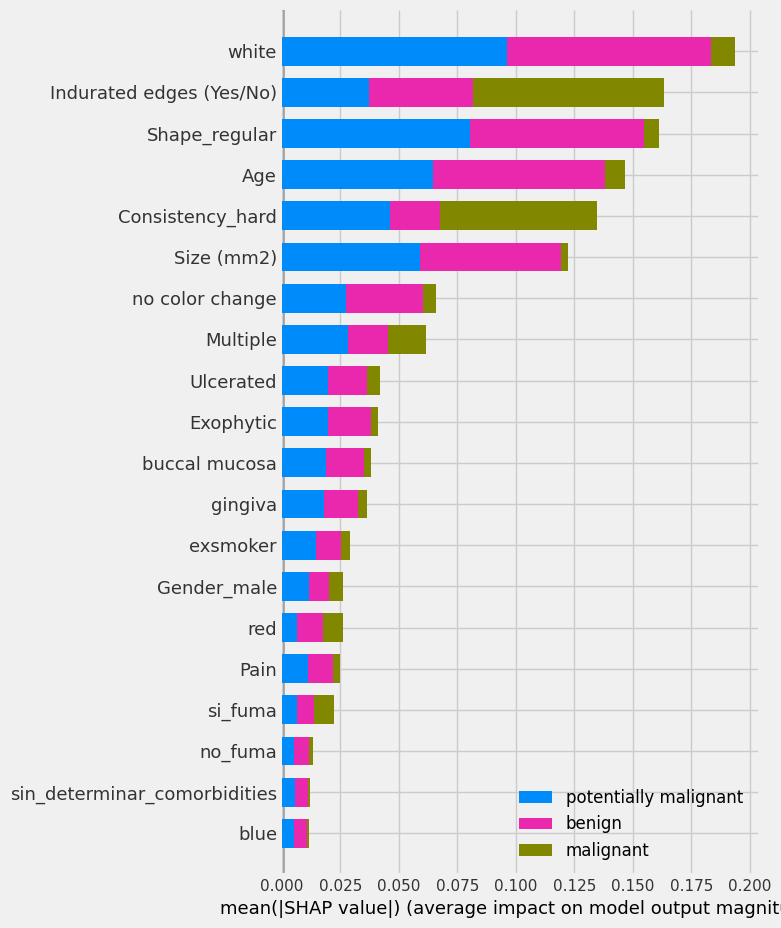


XGBOOST: Importancia de Variables (SHAP)


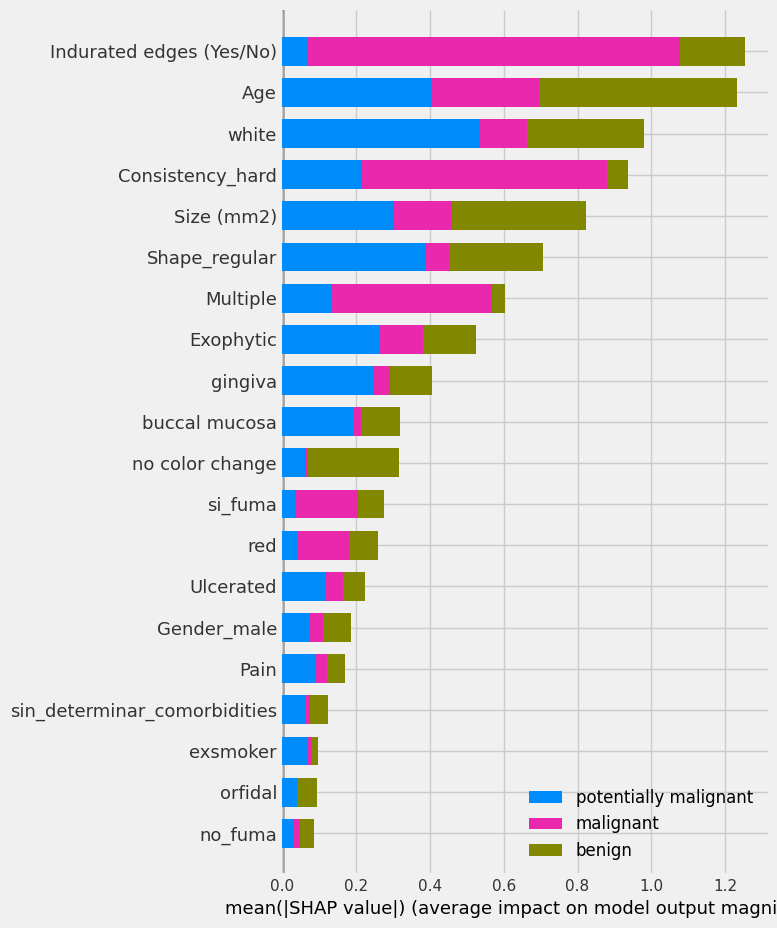


CATBOOST: Importancia de Variables (SHAP)


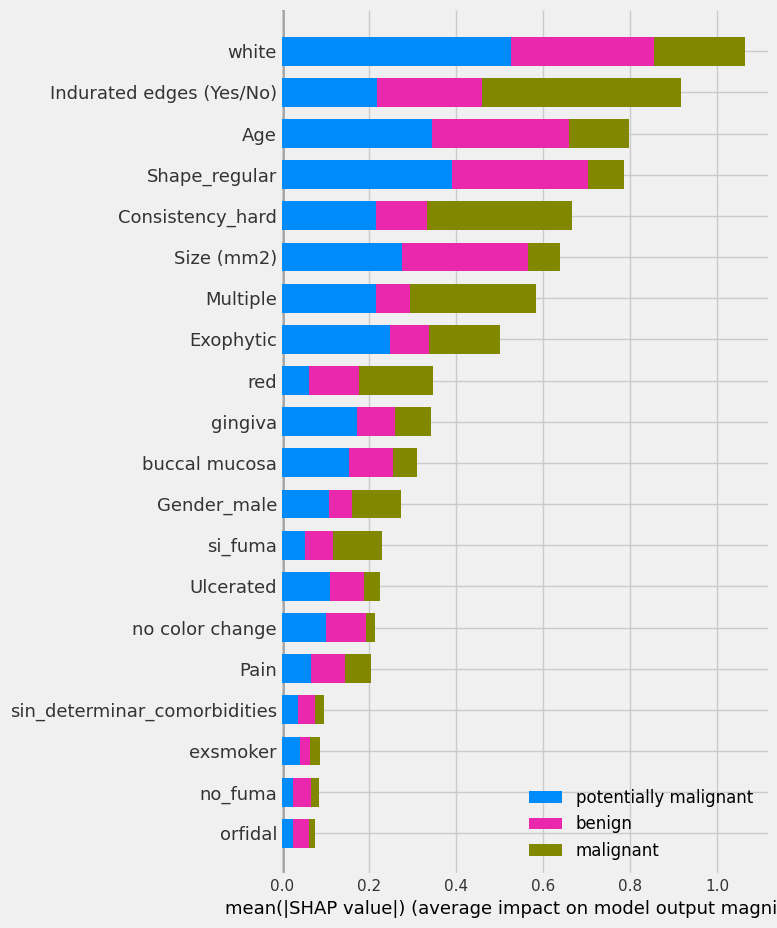

In [ ]:
class_colors = {
    0: 'blue',  # Ejemplo de mapeo, ajusta según tus clases y colores preferidos
    1: 'red',
    2: 'green'
}

shap.initjs()

# RANDOM FOREST
print("\n\033[1mRANDOM FOREST: Importancia de Variables (SHAP)\033[5m")
# Para Random Forest, shap_values tiene una lista de arrays (una para cada clase)
explainer_rf = shap.TreeExplainer(grid_search_rf.best_estimator_)
# Calculo de los valores SHAP
shap_values_rf = explainer_rf.shap_values(X_test)
shap.summary_plot(shap_values_rf, X_test, plot_type="bar", class_names=le.classes_)


# XGBOOST
print("\n\033[1mXGBOOST: Importancia de Variables (SHAP)\033[5m")
explainer_xgb = shap.TreeExplainer(grid_search_xgb.best_estimator_)
shap_values_xgb = explainer_xgb.shap_values(X_test)
shap.summary_plot(shap_values_xgb, X_test, plot_type="bar", class_names=le.classes_)


# CATBOOST
print("\n\033[1mCATBOOST: Importancia de Variables (SHAP)\033[5m")
explainer_cb = shap.TreeExplainer(random_search_catboost.best_estimator_)
shap_values_cb = explainer_cb.shap_values(X_test)
shap.summary_plot(shap_values_cb, X_test, plot_type="bar", class_names=le.classes_)


RANDOM FOREST: Bening


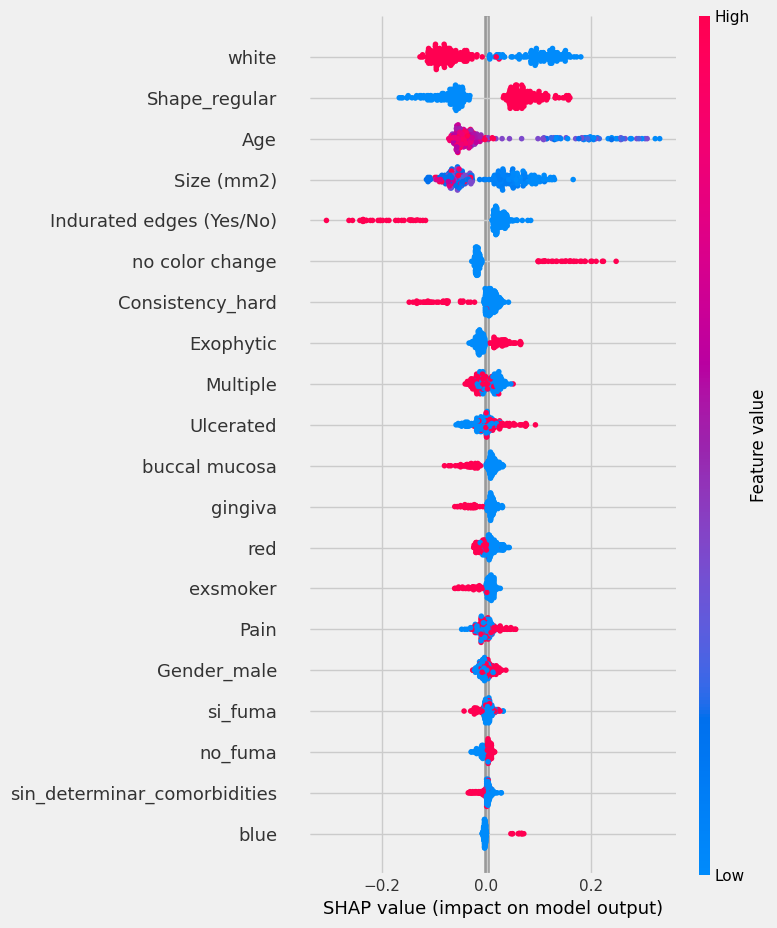


RANDOM FOREST: Malignant


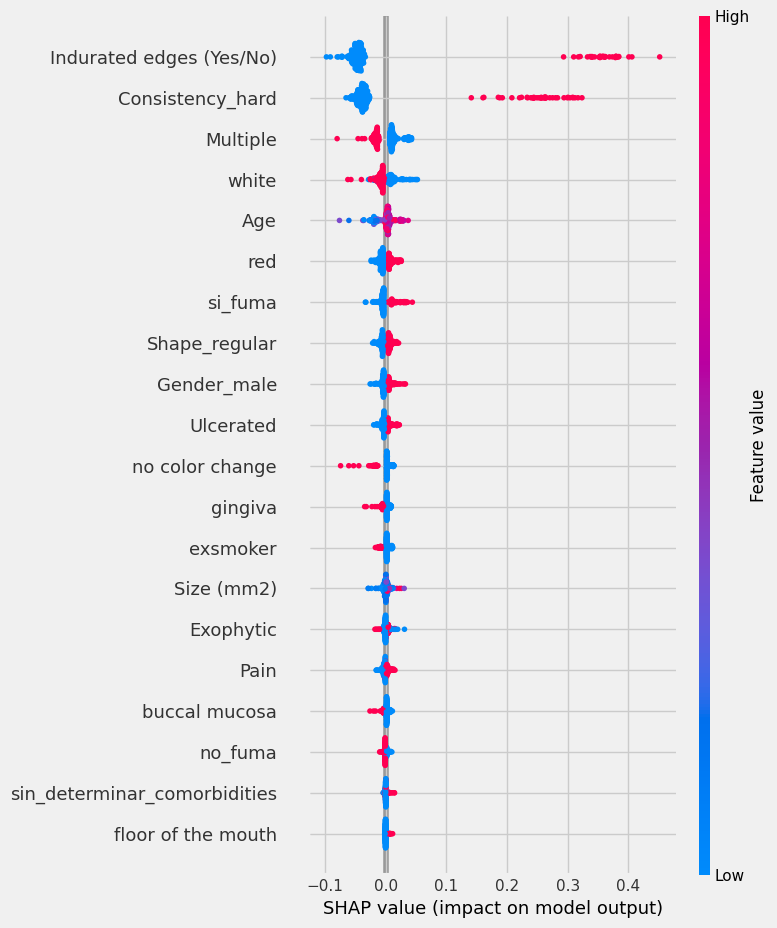


RANDOM FOREST: Potentially Malignant


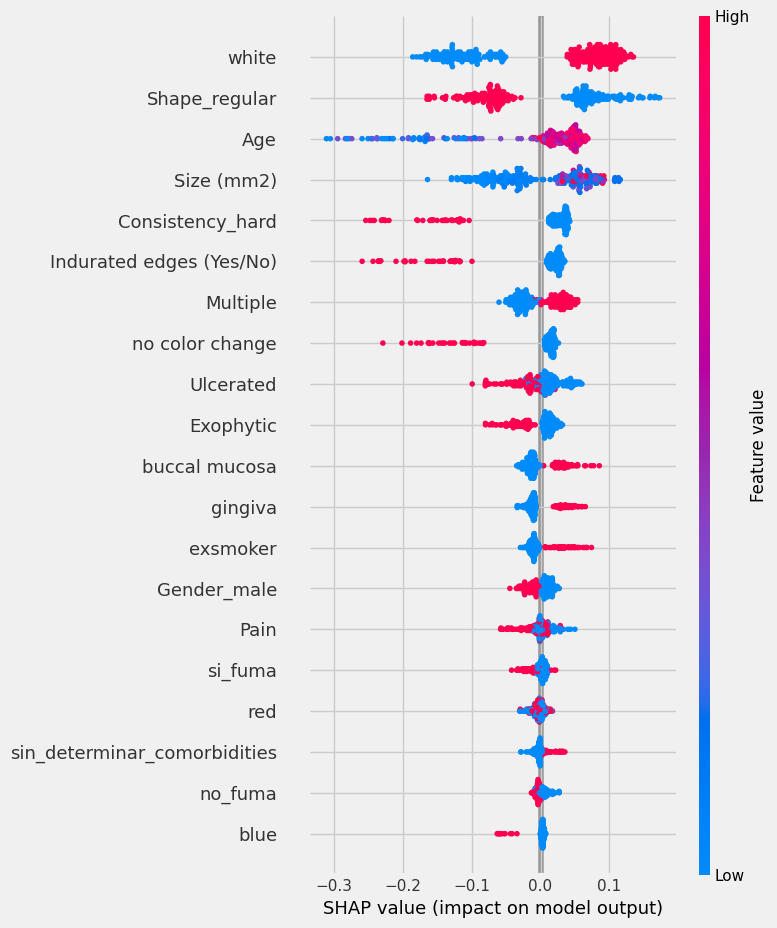

In [ ]:
# RANDOM FOREST
# Para la clase 0
print("\n\033[1mRANDOM FOREST: Bening\033[5m")
shap.summary_plot(shap_values_rf[:, :, 0], X_test, plot_type="dot")

# Para la clase 1
print("\n\033[1mRANDOM FOREST: Malignant\033[5m")
shap.summary_plot(shap_values_rf[:, :, 1], X_test, plot_type="dot")

# Para la clase 2
print("\n\033[1mRANDOM FOREST: Potentially Malignant\033[5m")
shap.summary_plot(shap_values_rf[:, :, 2], X_test, plot_type="dot")


XGBOOST: Bening


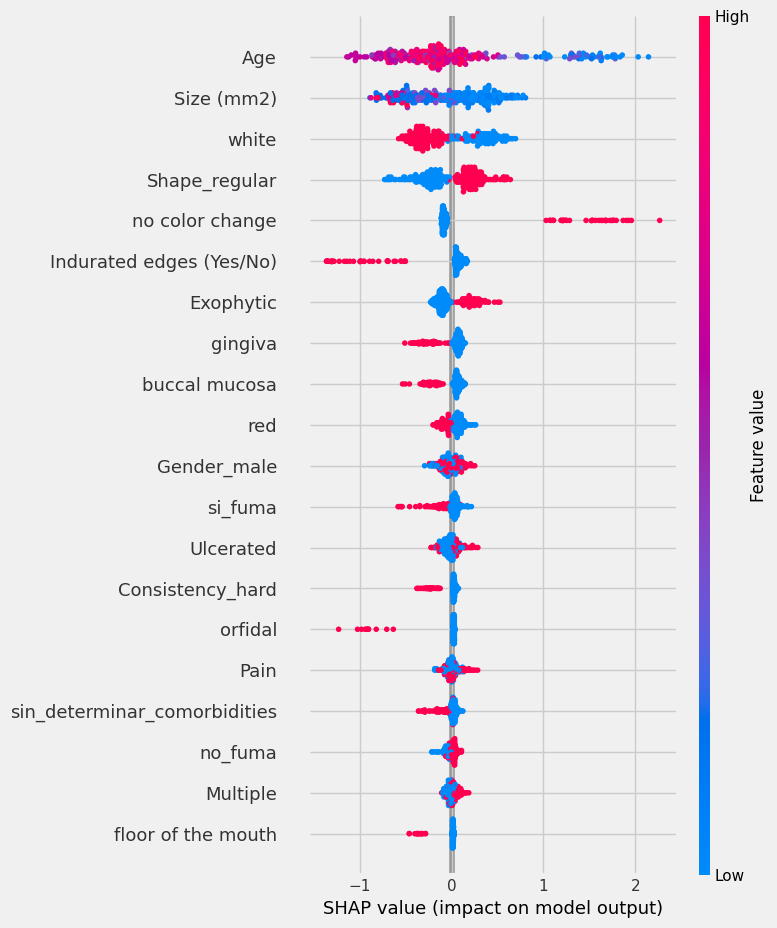


XGBOOST: Malignant


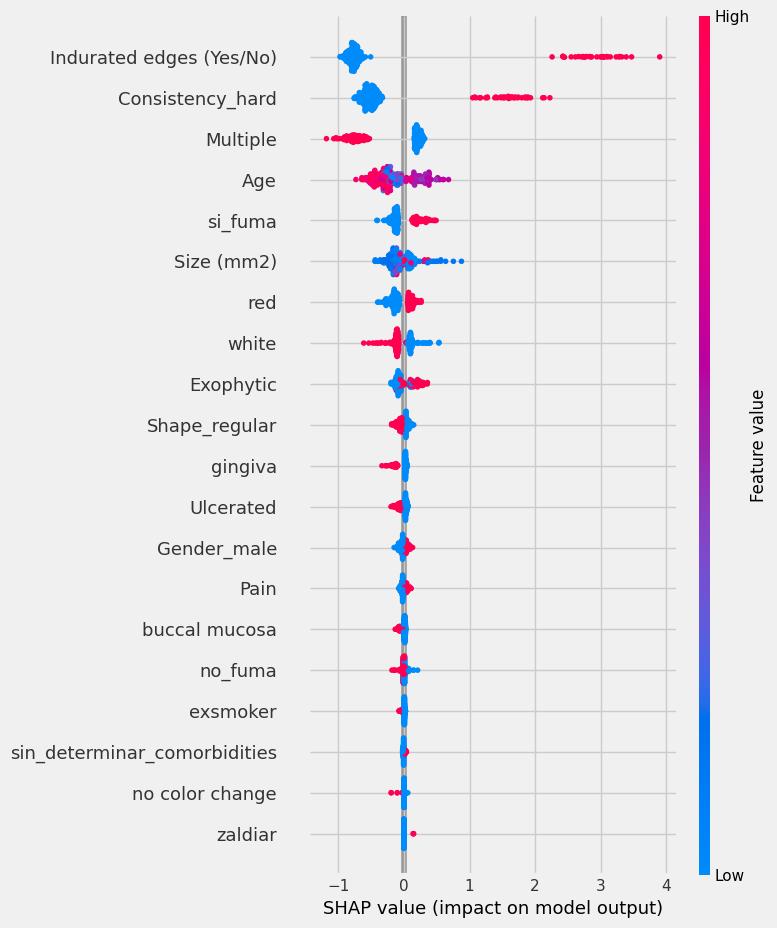


XGBOOST: Potentially Malignant


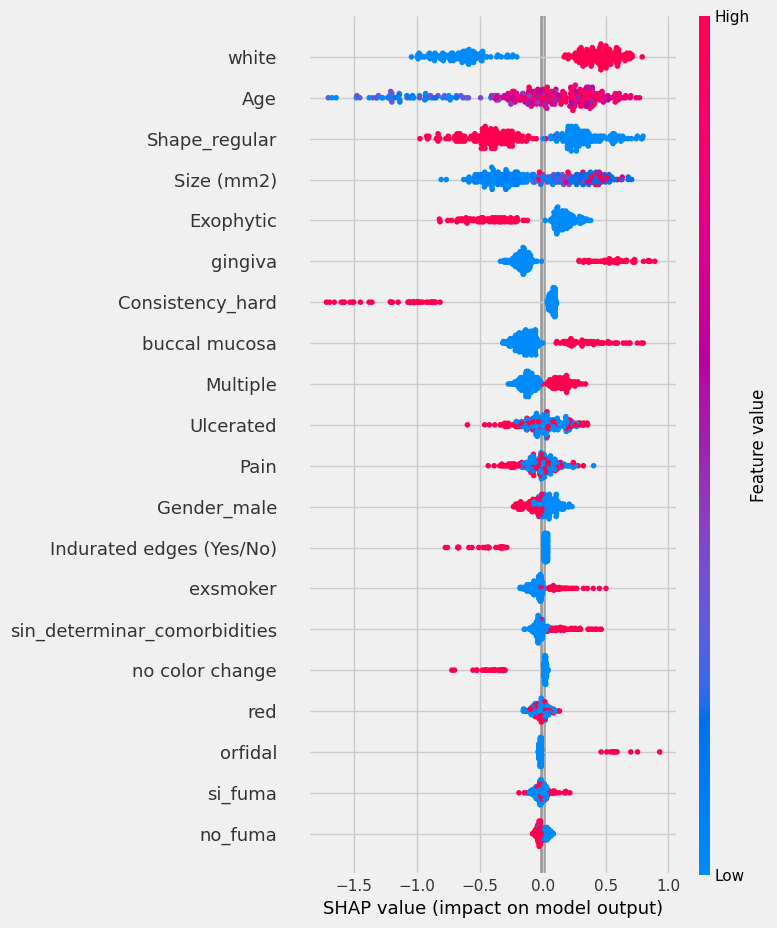

In [ ]:
# XGBOOST
# Para la clase 0
print("\n\033[1mXGBOOST: Bening\033[5m")
shap.summary_plot(shap_values_xgb[:, :, 0], X_test, plot_type="dot")

# Para la clase 1
print("\n\033[1mXGBOOST: Malignant\033[5m")
shap.summary_plot(shap_values_xgb[:, :, 1], X_test, plot_type="dot")

# Para la clase 2
print("\n\033[1mXGBOOST: Potentially Malignant\033[5m")
shap.summary_plot(shap_values_xgb[:, :, 2], X_test, plot_type="dot")



CATBOOST: Bening


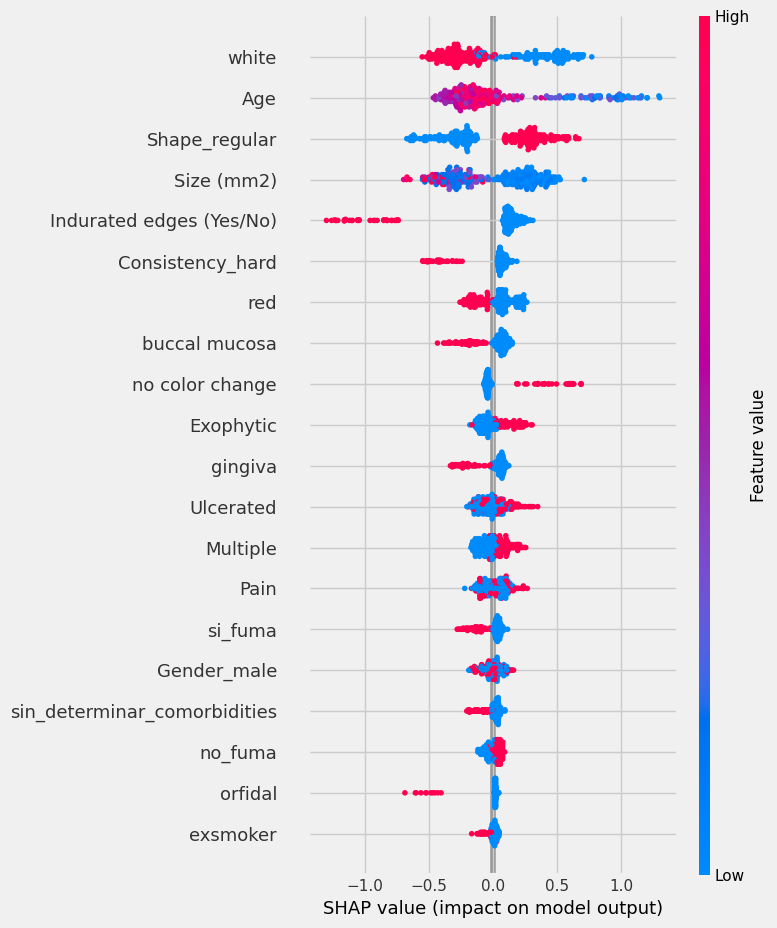


CATBOOST: Malignant


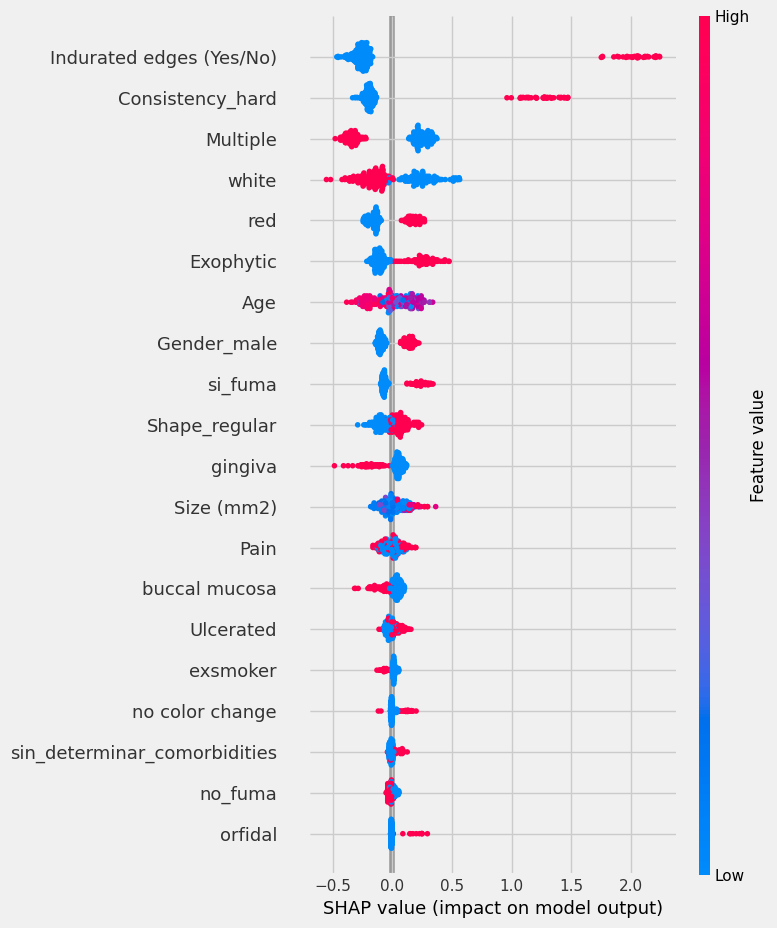


CATBOOST: Potentially Malignant


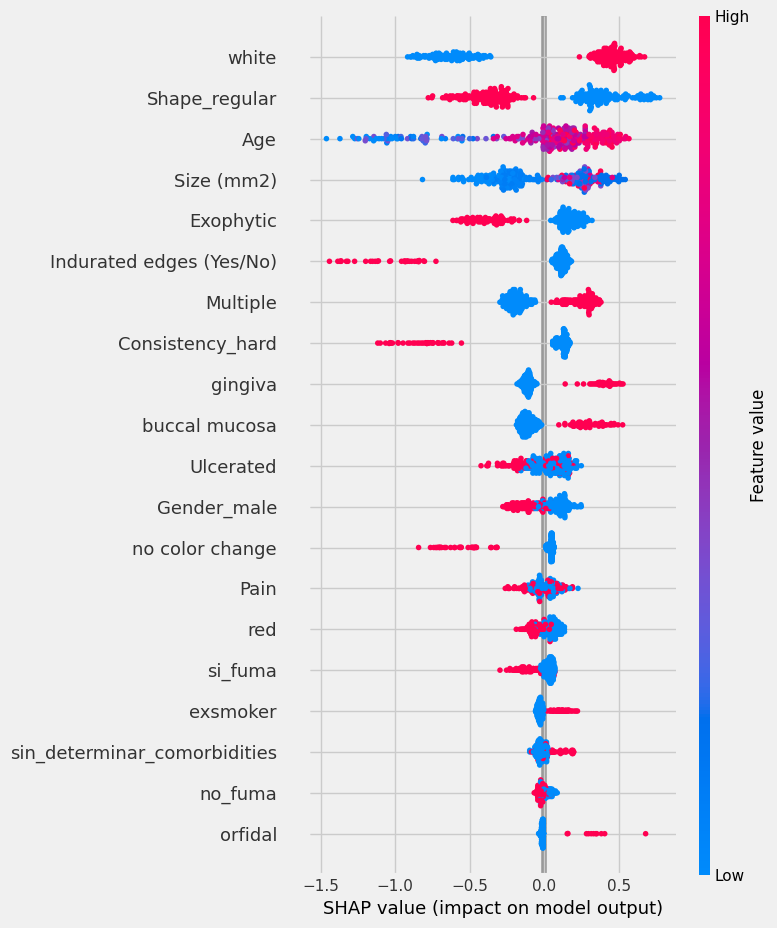

In [ ]:
# CATBOOST
# Para la clase 0
print("\n\033[1mCATBOOST: Bening\033[5m")
shap.summary_plot(shap_values_cb[:, :, 0], X_test, plot_type="dot")

# Para la clase 1
print("\n\033[1mCATBOOST: Malignant\033[5m")
shap.summary_plot(shap_values_cb[:, :, 1], X_test, plot_type="dot")

# Para la clase 2
print("\n\033[1mCATBOOST: Potentially Malignant\033[5m")
shap.summary_plot(shap_values_cb[:, :, 2], X_test, plot_type="dot")


### **6.2.2 Interpretacion local**

PermutationExplainer explainer: 303it [02:23,  2.05it/s]


RANDOM FOREST: Comparativo de todas las clases para la instancia

Clase: benign


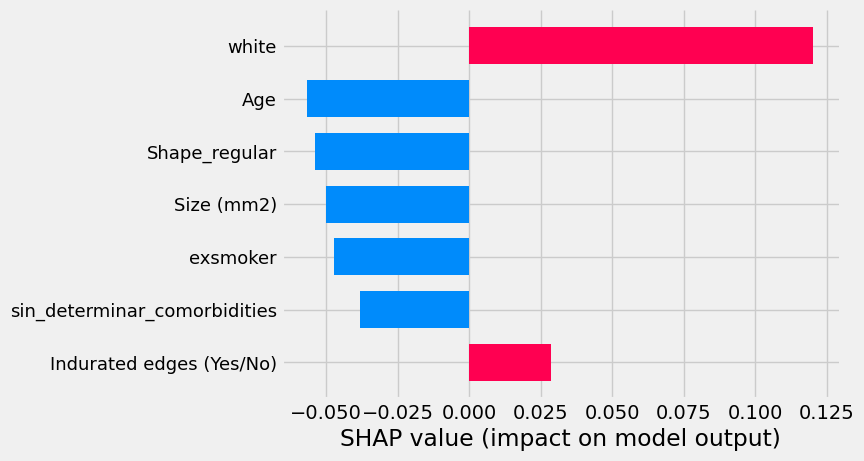


Clase: malignant


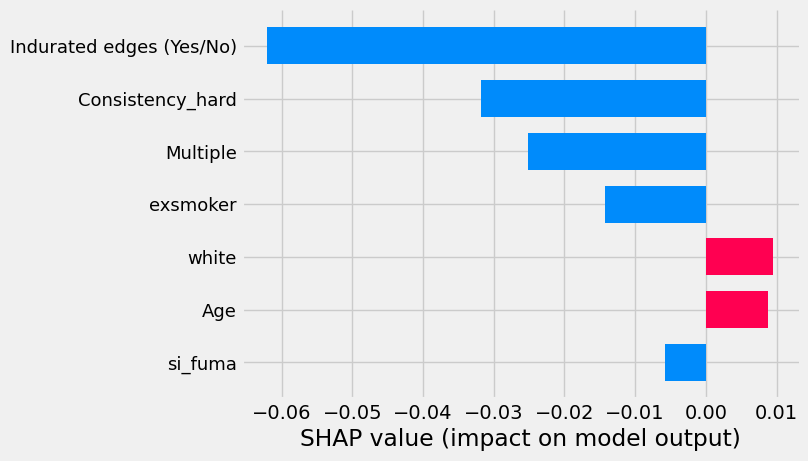


Clase: potentially malignant


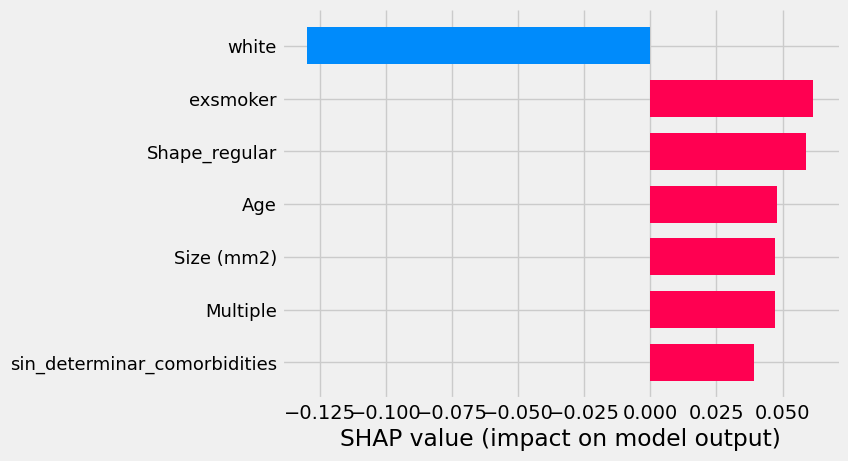

In [ ]:
# REPRESENTACIÓN DE UNA INSTANCIA ESPECÍFICA CON SHAP (RANDOM FOREST)
instance_index = 5
instance_to_explain = X_test_np[instance_index].reshape(1, -1)

# ======================= RANDOM FOREST SHAP ===========================
rf_model = grid_search_rf.best_estimator_

# Crear el explicador
explainer_rf = shap.Explainer(rf_model.predict_proba, X_train_np, feature_names=feature_names)
shap_values_rf = explainer_rf(X_test_np)

print("\n\033[1mRANDOM FOREST: Comparativo de todas las clases para la instancia\033[0m")
for class_idx, class_name in enumerate(class_names):
    print(f"\nClase: {class_name}")

    # Extraer los valores SHAP (solo los valores) para esa clase
    shap_values_class = shap_values_rf.values[instance_index, :, class_idx]

    # Mostrar gráfico de barras
    shap.bar_plot(shap_values_class, feature_names=feature_names)

PermutationExplainer explainer: 303it [00:51,  4.85it/s]



XGBOOST: Comparativo de todas las clases para la instancia

Clase: benign


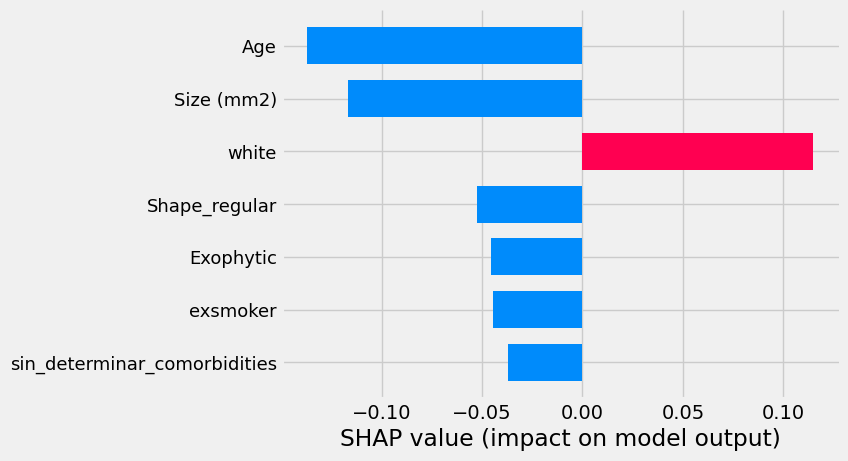


Clase: malignant


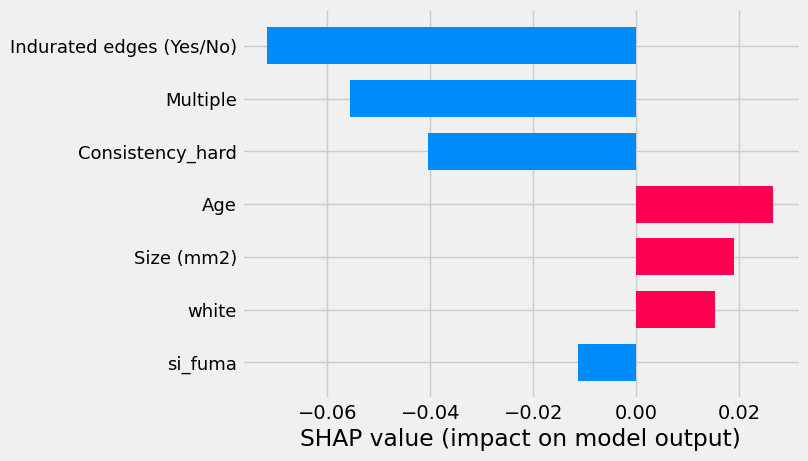


Clase: potentially malignant


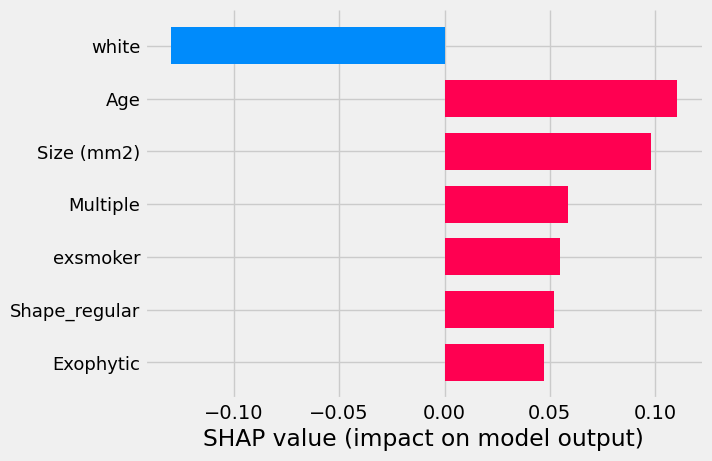

In [ ]:
# REPRESENTACIÓN DE UNA INSTANCIA ESPECÍFICA CON SHAP (XGBoost)
instance_index = 5
instance_to_explain = X_test_np[instance_index].reshape(1, -1)

# ======================= XGBOOST SHAP ===========================
xgb_model = grid_search_xgb.best_estimator_

# Crear el explicador
explainer_xgb = shap.Explainer(xgb_model.predict_proba, X_train_np, feature_names=feature_names)
shap_values_xgb = explainer_xgb(X_test_np)

print("\n\033[1mXGBOOST: Comparativo de todas las clases para la instancia\033[0m")
for class_idx, class_name in enumerate(class_names):
    print(f"\nClase: {class_name}")

    # Extraer los valores SHAP (solo los valores) para esa clase
    shap_values_class = shap_values_xgb.values[instance_index, :, class_idx]

    # Mostrar gráfico de barras
    shap.bar_plot(shap_values_class, feature_names=feature_names)


PermutationExplainer explainer: 303it [01:35,  2.90it/s]


CATBOOST: Comparativo de todas las clases para la instancia

Clase: benign


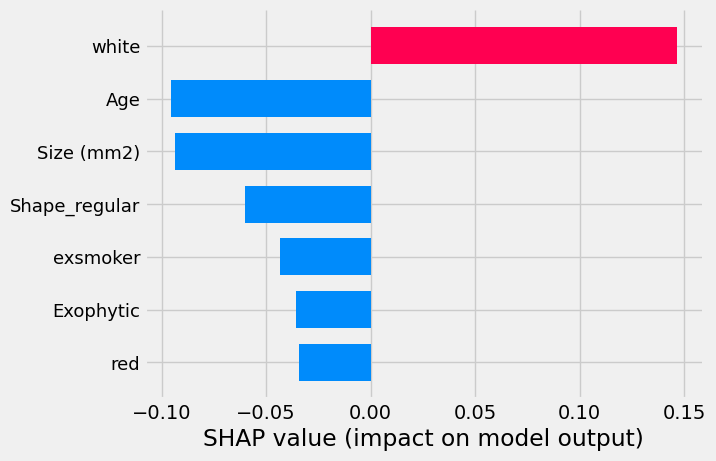


Clase: malignant


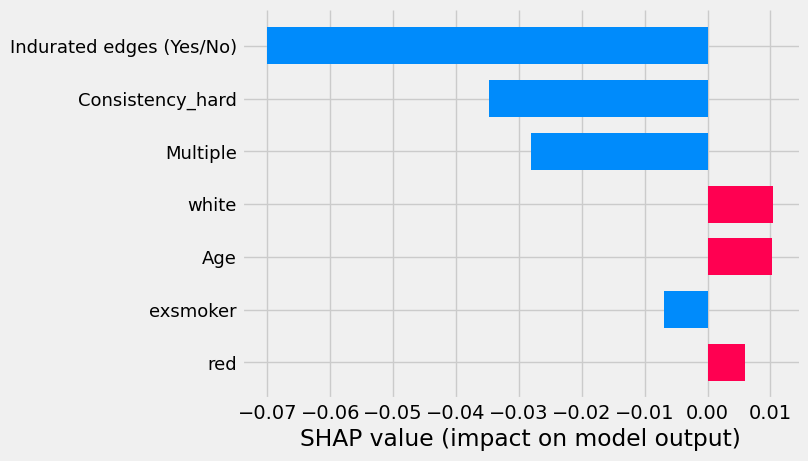


Clase: potentially malignant


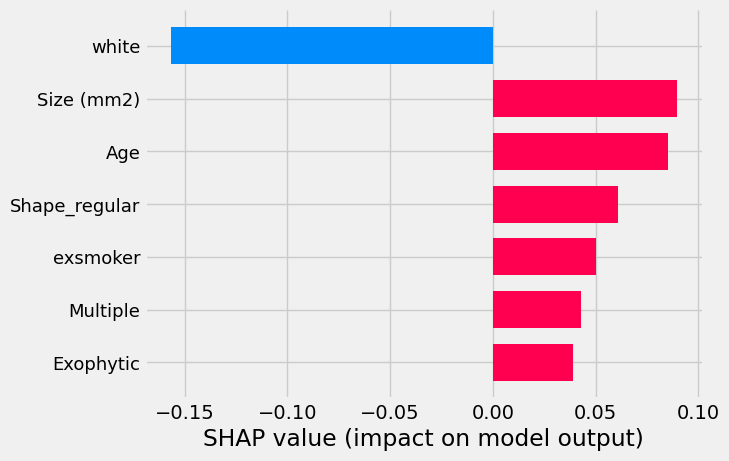

In [ ]:
# REPRESENTACION DE UNA INSTANCIA ESPECIFICA CON SHAP
instance_index = 5
instance_to_explain = X_test_np[instance_index].reshape(1, -1)

# ======================= CATBOOST SHAP ===========================
cb_model = random_search_catboost.best_estimator_

# Crear el explicador
explainer_cb = shap.Explainer(cb_model.predict_proba, X_train_np, feature_names=feature_names)
shap_values_cb = explainer_cb(X_test_np)

print("\n\033[1mCATBOOST: Comparativo de todas las clases para la instancia\033[0m")
for class_idx, class_name in enumerate(class_names):
    print(f"\nClase: {class_name}")

    # Extraer los valores SHAP (solo los valores) para esa clase
    shap_values_class = shap_values_cb.values[instance_index, :, class_idx]

    # Usar bar_plot directamente con los valores y nombres de características
    shap.bar_plot(shap_values_class, feature_names=feature_names)

## **6.2 LIME**

### **6.1.1 Interpretacion local**

In [ ]:
# REPRESENTACIÓN DE UNA INSTANCIA CON LIME
X_train_np = X_train.values
X_test_np = X_test.values
feature_names = X_test.columns.tolist()
class_names = le.classes_

# Verifica el orden de clases
print("Orden de clases:", class_names)

# Instancia a explicar
instance_index = 5

# ======================= Random Forest =======================
rf_model = grid_search_rf.best_estimator_

explainer_rf = LimeTabularExplainer(
    training_data=X_train_np,
    feature_names=feature_names,
    class_names=class_names,
    mode='classification',
    discretize_continuous=True
)

print("=== Random Forest ===")
print("Referencia real:", le.inverse_transform([y_test_enc[instance_index]])[0])
print("Predicción (probabilidades):", rf_model.predict_proba(X_test_np)[instance_index])
print("Clase predicha:", class_names[rf_model.predict(X_test_np)[instance_index]])

exp_rf = explainer_rf.explain_instance(
    data_row=X_test_np[instance_index],
    predict_fn=rf_model.predict_proba,
    labels=[0, 1, 2]  # Mostrar ambas clases
)
exp_rf.show_in_notebook(show_table=True, show_all=False)

# ======================= XGBoost =======================
xgb_model = grid_search_xgb.best_estimator_

explainer_xgb = LimeTabularExplainer(
    training_data=X_train_np,
    feature_names=feature_names,
    class_names=class_names,
    mode='classification',
    discretize_continuous=True
)

print("\n=== XGBoost ===")
print("Referencia real:", le.inverse_transform([y_test_encodedxgb[instance_index]])[0])
print("Predicción (probabilidades):", xgb_model.predict_proba(X_test_np)[instance_index])
print("Clase predicha:", class_names[xgb_model.predict(X_test_np)[instance_index]])

exp_xgb = explainer_xgb.explain_instance(
    data_row=X_test_np[instance_index],
    predict_fn=xgb_model.predict_proba,
    labels=[0, 1, 2]
)
exp_xgb.show_in_notebook(show_table=True, show_all=False)

# ======================= CatBoost =======================
cb_model = random_search_catboost.best_estimator_

explainer_cb = LimeTabularExplainer(
    training_data=X_train_np,
    feature_names=feature_names,
    class_names=class_names,
    mode='classification',
    discretize_continuous=True
)

print("\n=== CatBoost ===")
print("Referencia real:", le.inverse_transform([y_test_encodedcb[instance_index]])[0])
print("Predicción (probabilidades):", cb_model.predict_proba(X_test)[instance_index])
print("Clase predicha:", class_names[cb_model.predict(X_test)[instance_index]])

exp_cb = explainer_cb.explain_instance(
    data_row=X_test_np[instance_index],
    predict_fn=cb_model.predict_proba,
    labels=[0, 1, 2]
)
exp_cb.show_in_notebook(show_table=True, show_all=False)


Orden de clases: ['benign' 'malignant' 'potentially malignant']
=== Random Forest ===
Referencia real: potentially malignant
Predicción (probabilidades): [0.22679056 0.01690423 0.75630521]
Clase predicha: potentially malignant



=== XGBoost ===
Referencia real: potentially malignant
Predicción (probabilidades): [0.09189555 0.01987686 0.8882276 ]
Clase predicha: potentially malignant



=== CatBoost ===
Referencia real: potentially malignant
Predicción (probabilidades): [0.20213012 0.01130484 0.78656504]
Clase predicha: ['potentially malignant']
